In [1]:
import torch
import torch.nn as nn

import numpy as np
import numpy.testing as npt
import matplotlib.pyplot as plt

from torchvision.models import vgg13
from torch.utils.data import Dataset, DataLoader

import os
import natsort
from PIL import Image
from torchvision.transforms import ToPILImage
import torchvision
import copy
from torch.autograd import Variable

In [2]:
%%html
<style>
.output_wrapper, .output {
    height:auto !important;
    max-height:5000px;
}
.output_scroll {
    box-shadow:none !important;
    webkit-box-shadow:none !important;
}
</style>

In [3]:
class PhotosDataset(Dataset):
    def __init__(self, images_dir):
        self.images_dir = images_dir
        self.image_names = natsort.natsorted(os.listdir(images_dir))     
        
    def __len__(self):
        return len(self.image_names)
                   
    def __getitem__(self, idx):
        image_loc = os.path.join(self.images_dir, self.image_names[idx])
        image = Image.open(image_loc).convert("RGB")
        return image
    
def tonp(image): # (100, 100, 3)
    return np.array(image)

def topil(array):
    return ToPILImage()(array)

def tonp2(image): # (3, 100, 100)
    return np.array(image).transpose(2, 0, 1)

def topil2(array):
    return ToPILImage()((array).transpose(1, 2, 0))

def tobw(image, threshold):
    arr = tonp2(image)
    new_arr = np.zeros_like(arr)
    new_arr[:, arr[0] + arr[1] + arr[2] <= threshold] = 255
    return topil2(new_arr)

def getpix(image, i, j):
    arr = tonp(image)
    return arr[i, j]

def putpix(image, i, j, color):
    arr = tonp(image)
    arr[i, j] = np.array(color)
    return topil(arr)

In [4]:
def flip(image):
    arr = tonp2(image)
    matr = np.fromfunction(lambda i, j: i + j == arr.shape[2], (arr.shape[2], arr.shape[2]))
    return topil2(np.dot(arr, matr))

def mask(image, the_mask, threshold=120):
    arr = tonp2(image).astype(int)
    new_arr = copy.copy(arr)
    for i in range(1, new_arr.shape[1] - 1):
        for j in range(1, new_arr.shape[2] - 1):
            new_arr[:, i, j] = np.sum(arr[:, i - 1:i + 2, j - 1:j + 2] * the_mask)
    new_arr[new_arr <= threshold] = 0
    return topil2(new_arr.astype(np.uint8))

def conv(image, n):
    if n <= 1:
        return image
    arr = tonp2(image)
    new_arr = copy.copy(arr)#[:, n:-n, n:-n]
    #for i in range(new_arr.shape[1]):
    #    for j in range(new_arr.shape[2]):
    #        for k in range(3):
    #            il = i - n if i - n > 0 else 0
    #            jl = j - n if j - n > 0 else 0
    #            new_arr[k, i, j] = np.mean(arr[k, il:i + n + 1:1, jl:j + n + 1])
    for i in range(new_arr.shape[1] // n):
        for j in range(new_arr.shape[2] // n):
            for k in range(3):
                #il = i - n if i - n > 0 else 0
                #jl = j - n if j - n > 0 else 0
                new_arr[k, i*n:i*n + n, j*n:j*n + n] = np.mean(arr[k, i*n:i*n + n, j*n:j*n + n])
    return topil2(new_arr)

def conv2(image, n): # n=25 нормальный такой
    if n <= 1:
        return image
    arr = tonp2(image)
    new_arr = np.zeros((3, arr.shape[1]//n, arr.shape[2]//n), dtype=np.uint8)
    for i in range(new_arr.shape[1]):
        for j in range(new_arr.shape[2]):
            for k in range(3):
                new_arr[k, i, j] = arr[k, i*n, j*n]
    #print(new_arr.shape)
    return topil2(new_arr)


def unbright(image, threshold=255, delta=30):
    arr = tonp2(image)
    brightness = arr[0].astype(int) + arr[1].astype(int) + arr[2].astype(int)
    mask = brightness >= threshold
    arr[0, mask] -= delta
    arr[1, mask] -= delta
    arr[2, mask] -= delta
    return topil2(arr)

def unbright2(image, threshold=50, delta=50):
    arr = tonp2(image)
    brightness1 = arr[0].astype(int) >= threshold
    brightness2 = arr[1].astype(int) >= threshold
    brightness3 = arr[2].astype(int) >= threshold
    mask = brightness1 * brightness2 * brightness3
    arr[0, mask] -= delta
    arr[1, mask] -= delta
    arr[2, mask] -= delta
    return topil2(arr)


def bright2(image, delta=50):
    arr = tonp2(image).astype(int)
    brightness1 = arr[0].astype(int) != 0
    brightness2 = arr[1].astype(int) != 0
    brightness3 = arr[2].astype(int) != 0
    mask = brightness1 * brightness2 * brightness3
    arr[0, mask] += delta
    arr[1, mask] += delta
    arr[2, mask] += delta
    arr[arr > 255] = 255
    return topil2(arr.astype(np.uint8))

def gen_loccol(image, c, threshold):
    """
    Все похожие цвета изображения в виде массива
    """
    arr = tonp2(image).astype(int)
    #print((arr[0] - c[0]))
    #print((arr[0] - c[0])**2)
    dist = ((arr[0] - c[0])**2 + (arr[1] - c[1])**2 + (arr[2] - c[2])**2)**0.5
    return dist <= threshold






def add_to_gr(arr, index, gr):
    """
    Добавление в группу позиций на -1-цах (есть массив: нули там, где нет объектов, -1 - там, где есть)
    """
    if arr[index[0], index[1]] == -1:
        arr[index[0], index[1]] = gr
        if index[0] > 0:
            arr = add_to_gr(arr, [index[0] - 1, index[1]], gr)
        if index[0] < arr.shape[0] - 1:
            arr = add_to_gr(arr, [index[0] + 1, index[1]], gr)
        if index[1] > 0:
            arr = add_to_gr(arr, [index[0], index[1] - 1], gr)
        if index[1] < arr.shape[1] - 1:
            arr = add_to_gr(arr, [index[0], index[1] + 1], gr)
    return arr

def make_share(array):
    """
    Распределение массива пикселей объектов по группам
    array - 0, где нет предметов, -1 - где есть
    """
    gr = 1
    while np.any(array == -1):
        first = np.where(array == -1)
        first = np.array([first[0][0], first[1][0]])
        #print(first)
        array = add_to_gr(array, first, gr)
        gr += 1
    return array

def seg_to_image(image, array):
    """
    Перевод на изображение результатов сегментации с укороченным массивом 
    (с размеченными по группам пикселями)
    """
    img_arr = tonp(image)
    img_shape = img_arr.shape
    ix = img_shape[0] // array.shape[0]
    jx = img_shape[1] // array.shape[1]
    #max_gr = np.max(array)
    frames = []
    #for gr in range(1, max_gr + 1):
    for gr in np.unique(array)[1:]:
        all_ind = np.where(array == gr)
        imin = array.shape[0] - 1
        jmin = array.shape[1] - 1
        imax = 0
        jmax = 0
        for indix in range(len(all_ind[0])):
            if all_ind[0][indix] < imin:
                imin = all_ind[0][indix]
            if all_ind[0][indix] > imax:
                imax = all_ind[0][indix]
            if all_ind[1][indix] < jmin:
                jmin = all_ind[1][indix]
            if all_ind[1][indix] > jmax:
                jmax = all_ind[1][indix]     
        imin *= ix
        jmin *= jx
        imax *= ix
        jmax *= jx
        scx = 30
        imin -= img_shape[0]//scx
        imax += img_shape[0]//scx
        jmin -= img_shape[1]//scx
        jmax += img_shape[1]//scx
        img_arr[imin, jmin:jmax] = np.array([255, 0, 0])
        img_arr[imax, jmin:jmax] = np.array([255, 0, 0])
        img_arr[imin:imax, jmin] = np.array([255, 0, 0])
        img_arr[imin:imax, jmax] = np.array([255, 0, 0])
        frames += [(imin, imax, jmin, jmax)]
    return topil(img_arr), frames





def cut(image, frame):
    """
    Вырезание прямоугольника изображения с заданными координатами
    """
    arr = tonp(image)
    new_arr = copy.copy(arr)[frame[0]:frame[1], frame[2]:frame[3]]
    return topil(new_arr)




def desease_step(array, index, step):
    #print(array.shape)
    #print(array[index[0], index[1], :])
    if np.sum(array[index[0]-step:index[0]+step+1, index[1]-step:index[1]+step+1, :])==0:
        array[index[0], index[1], :] = np.array([255, 0, 0])
        if index[0] - step*2 >= 0:
            array, f = desease_step(array, [index[0] - step*2, index[1]], step)
        if index[0] + step*2 < array.shape[0]:
            array, f = desease_step(array, [index[0] + step*2, index[1]], step)
        if index[1] - step*2 >= 0:
            array, f = desease_step(array, [index[0], index[1] - step*2], step)
        if index[1] + step*2 < array.shape[1]:
            array, f = desease_step(array, [index[0], index[1] + step*2], step)
        return array, True
    #else:
    #    array[index, :] = np.array([255, 255, 255])
    return array, False
    

def desease(image, step):
    arr = tonp(image)
    ind = np.array([arr.shape[0] // 2, arr.shape[1] // 2])
    #ind = np.array([1, 1])
    flag = False
    while not flag:
        arr, flag = desease_step(arr, ind, step)
        ind[0] += 1
    return topil(arr)




def incw(image, n, threshold=1):
    """
    Расширение белых макропикселей при их локальном большинстве
    """
    arr = tonp(image)
    for i in range(arr.shape[0] // n):
        for j in range(arr.shape[1] // n):
            if np.count_nonzero(arr[i*n:(i+1)*n, j*n:(j+1)*n]) >= threshold:
                arr[i*n:(i+1)*n, j*n:(j+1)*n, :] = 255
            else:
                arr[i*n:(i+1)*n, j*n:(j+1)*n, :] = 0
    return topil(arr)


def make_perimeter(image):
    arr = tonp(image).astype(int)
    
    x_ind = arr.shape[1] // 2
    u_ind = d_ind = arr.shape[0] // 2
    while np.all(arr[u_ind, x_ind] == 0) and u_ind > 0:
        u_ind -= 1
    while np.all(arr[u_ind, x_ind] != 0) and u_ind > 0:
        u_ind -= 1
    u_ind += 1
    while np.all(arr[d_ind, x_ind] == 0) and d_ind < arr.shape[0] - 1:
        d_ind += 1
    while np.all(arr[d_ind, x_ind] != 0) and d_ind > arr.shape[0] - 1:
        d_ind += 1
    d_ind -= 1
    
    base_u_ind = u_ind
    base_d_ind = d_ind
    #print('base:', base_u_ind, base_d_ind)
    
    for k0 in range(2):
        for k in range(-1, 2, 2):
            #u_ind = base_u_ind
            #d_ind = base_d_ind
            #x_ind = arr.shape[1] // 2
            #print(arr.shape)
            while np.any(arr[u_ind:d_ind+1, x_ind] != 0) and 0 <= x_ind < arr.shape[1] - 1:
                #print(d_ind, u_ind, x_ind)
                while np.all(arr[u_ind, x_ind] != 0) and u_ind > 0:
                    u_ind -= 1
                while np.all(arr[u_ind, x_ind] == 0) and u_ind < arr.shape[0] - 1:
                    u_ind += 1

                while np.all(arr[d_ind, x_ind] != 0) and d_ind < arr.shape[0] - 1:
                    d_ind += 1
                while np.all(arr[d_ind, x_ind] == 0) and d_ind > 0:
                    d_ind -= 1
                #print(x_ind, u_ind, d_ind)
                arr[u_ind:d_ind+1, x_ind] = -1
                x_ind += k
            x_ind -= k
    
    arr[arr != -1] = 0
    arr[arr == -1] = 1
    #print(arr)
    #return topil(arr.astype(np.uint8))
    return arr.astype(np.uint8)

In [5]:
def spread(array, i, j, val):
    """
    Распространение числового значения внутри одной группы
    """
    old_val = array[i, j]
    array[i, j] = val
    if i > 0 and array[i - 1, j] == old_val:
        array = spread(array, i - 1, j, val)
    if i < array.shape[0] - 1 and array[i + 1, j] == old_val:
        array = spread(array, i + 1, j, val)
    if j > 0 and array[i, j - 1] == old_val:
        array = spread(array, i, j - 1, val)
    if j < array.shape[1] - 1 and array[i, j + 1] == old_val:
        array = spread(array, i, j + 1, val)
    return array

def make_pred_unshare(array):
    groups = np.unique(array)[1:]
    array_buf = copy.copy(array)
    for gr in groups:
        for i in range(1, array.shape[0] - 1):
            for j in range(1, array.shape[1] - 1):
                x_itself = [array_buf[i-1, j], array_buf[i+1, j], array_buf[i, j-1], array_buf[i, j+1]]
                if np.count_nonzero(x_itself == gr) == 4:
                    array[i, j] = gr
    return array 

def make_one_unshare(array, true_power=None): # !!!
    array_buf = copy.copy(array)
    first = np.where(array != 0)
    first = np.array([first[0][0], first[1][0]])
    gr = array[tuple(first)]
    for i in range(1, array.shape[0] - 1):
        for j in range(1, array.shape[1] - 1):
            x_itself = [array_buf[i-1, j], array_buf[i+1, j], array_buf[i, j-1], array_buf[i, j+1]]
            if np.mean(x_itself) <= 0.75 * gr: ### !!!
                array[i, j] = 0
    #first = np.where(array != 0)
    #first = np.array([first[0][0], first[1][0]])
    #gr = array[tuple(first)]
    #array = spread(array, first[0], first[1], gr + 100)
    return array

def make_back_unshare(array):
    groups = np.unique(array)[1:]
    array_buf = copy.copy(array)
    for gr in groups:
        for i in range(1, array.shape[0] - 1):
            for j in range(1, array.shape[1] - 1):
                x_itself = [array_buf[i-1, j], array_buf[i+1, j], array_buf[i, j-1], array_buf[i, j+1]]
                if np.any(x_itself == gr):
                    array[i, j] = gr
    return array    

def make_unshare(array, true_power, steps=4):
    """
    Разделение объединённых групп и удаление отделённых остатков
    """
    res = copy.copy(array)
    groups = {group : np.count_nonzero(array == group) for group in np.unique(array)}
    if 0 in groups:
        del groups[0]
    for gr in groups:
        if groups[gr] < 0.5 * true_power:
            res[array == gr] = 0
        elif groups[gr] > 1.5 * true_power:
            problem_indexes = np.where(array == gr)
            pr1 = problem_indexes[0]
            pr2 = problem_indexes[1]
            spec_frames = (np.max([np.min(pr1) - 1, 0]), np.min([np.max(pr1) + 1, array.shape[0] - 1]), np.max([np.min(pr2) - 1, 0]), np.min([np.max(pr2) + 1, array.shape[1] - 1]))
            spec_array = array[spec_frames[0]:spec_frames[1] + 1, spec_frames[2]:spec_frames[3] + 1]
            spec_array[spec_array != gr] = 0
            #print('> make_unshare(): Проблемная группа:')
            #show(topil(spec_array.astype(np.uint8))) ### !!!
            for k in range(1, steps + 1):
                spec_array = make_one_unshare(spec_array, true_power * (4 / 5) ** k)
            
            spec_array[spec_array == 0] = 100
            k_gr = 1
            while np.any(spec_array[spec_array != 0] < 100):
                #print(spec_array[spec_array != 0])
                first = np.where(spec_array < 100) ###
                first = np.array([first[0][0], first[1][0]]) ###
                spec_array = spread(spec_array, first[0], first[1], gr + k_gr * 100) ###
                k_gr += 1
            spec_array[spec_array == 100] = 0
            for k in range(1, steps):
                spec_array = make_back_unshare(spec_array)
                
            for k in range(1, k_gr + 1):
                if np.count_nonzero(spec_array == gr + k * 100) < 0.25 * true_power:
                    spec_array[spec_array == gr + k * 100] = 0
            spec_array = make_back_unshare(spec_array)
            res[spec_frames[0]:spec_frames[1] + 1, spec_frames[2]:spec_frames[3] + 1] = spec_array
    return res

In [6]:
class Masks:
    def __init__(self):
        pass
    
    def contrast(self):
        mask = -np.ones((3, 3))
        mask[1, 1] = 8
        return mask
    
    def hor(self):
        mask = -np.ones((3, 3))
        mask[1, :] = 2
        return mask
    
    def ver(self):
        mask = -np.ones((3, 3))
        mask[:, 1] = 2
        return mask
    
    def plus45(self):
        mask = -np.ones((3, 3))
        mask[0, 2] = 2
        mask[1, 1] = 2
        mask[2, 0] = 2
        return mask
    
    def minus45(self):
        mask = -np.ones((3, 3))
        mask[0, 0] = 2
        mask[1, 1] = 2
        mask[2, 2] = 2
        return mask
    
    def sobel1(self):
        mask = np.zeros((3, 3))
        mask[0, 0] = -1
        mask[0, 1] = -2
        mask[0, 2] = -1
        mask[2, 0] = 1
        mask[2, 1] = 2
        mask[2, 2] = 1
        return mask
    
    def sobel2(self):
        mask = np.zeros((3, 3))
        mask[0, 0] = -1
        mask[1, 0] = -2
        mask[2, 0] = -1
        mask[0, 2] = 1
        mask[1, 2] = 2
        mask[2, 2] = 1
        return mask
    
M = Masks()

In [7]:
print( M.hor() + M.ver())

[[-2.  1. -2.]
 [ 1.  4.  1.]
 [-2.  1. -2.]]


In [8]:
def sobel(image, conv_level=2):
    img1 = mask(conv(image, conv_level), M.sobel1())
    img2 = mask(conv(image, conv_level), M.sobel2())
    img = topil((tonp(img1) + tonp(img2)) // 2)
    return img

In [9]:
def show(image, figsize=(7, 7)):
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(image)
    plt.axis('off')
    print("Image shape: ", tonp(image).shape)
    plt.show()

In [10]:
PD = PhotosDataset('/Users/mac/Downloads/Обучение')

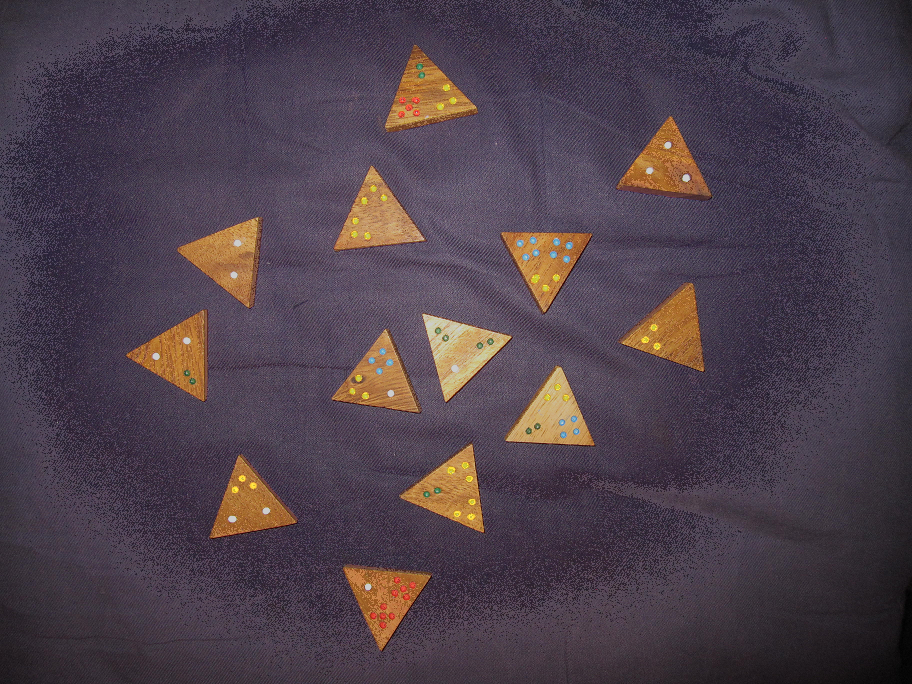

In [11]:
unbright2(PD[2], threshold=80, delta=50)

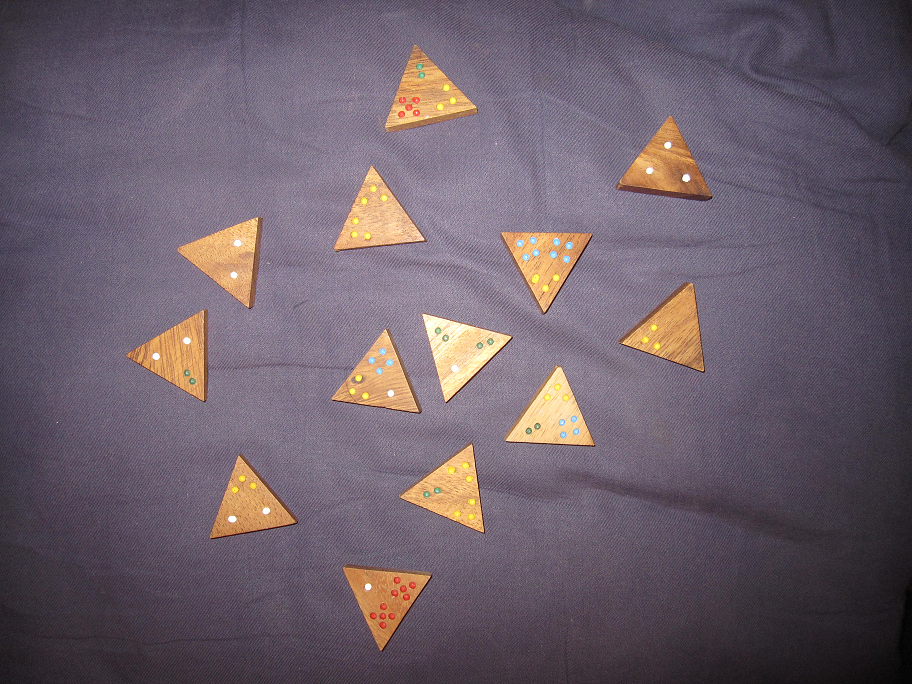

In [12]:
PD[2]

In [13]:
im0 = conv2(conv(unbright(PD[3]), 10), 30)

In [99]:
img0 = PD[2]
#img0 = PD[3]
#img0 = PD[4]

In [100]:
print(np.mean(tonp(PD[2])), np.mean(tonp(PD[3])), np.mean(tonp(PD[4])))

103.53882711774563 62.847093977634145 98.92073095140385


Image shape:  (68, 91, 3)


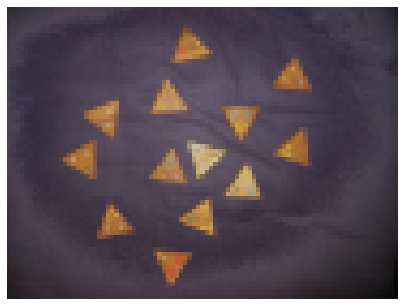

In [101]:
#im0 = conv2(conv(img0, 10), 20) 

#im0 = conv2(conv(unbright(img0), 10), 10)
#im0 = conv2(conv(img0, 10), 10)
im0 = conv2(conv(unbright2(img0, threshold=80, delta=50), 10), 10)
#im0 = conv2(conv(unbright2(img0, threshold=80, delta=0), 10), 10)
#im0 = conv2(conv(img0, 10), 10)

#im0 = conv2(conv(unbright(PD[2]), 10), 10)
#im0 = conv2(conv(unbright(PD[4]), 10), 10)
#im0 = conv2(conv(PD[3], 5), 5)
##im0 = conv2(conv(PD[3], 10), 10)
#im0 = conv2(conv(PD[3], 15), 15)
show(im0)

Image shape:  (68, 91, 3)


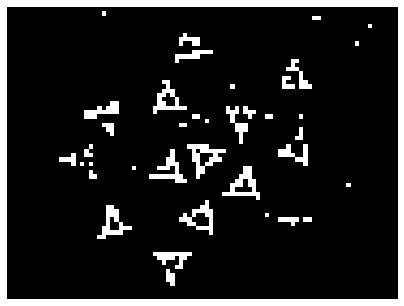

Image shape:  (684, 912, 3)


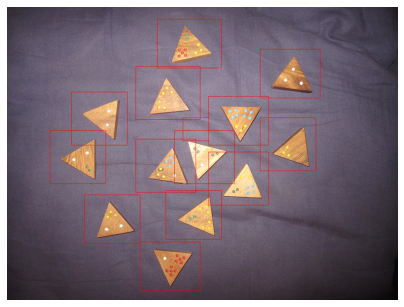

Image shape:  (68, 91, 3)


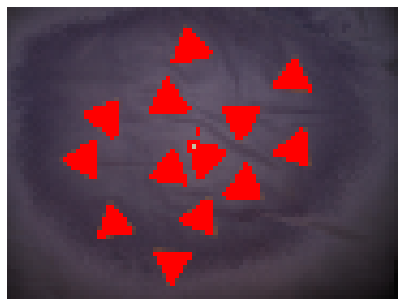

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]
Image shape:  (68, 91, 3)


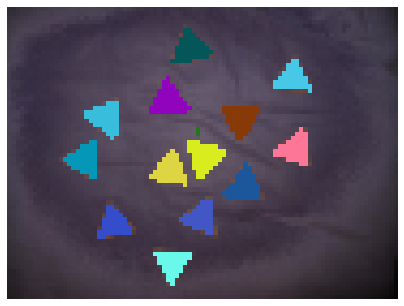

Image shape:  (68, 91, 3)


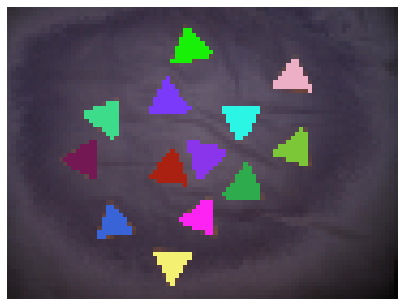

[ 0  1  2  3  4  5  7  8  9 10 11 12 13 14]
Image shape:  (684, 912, 3)


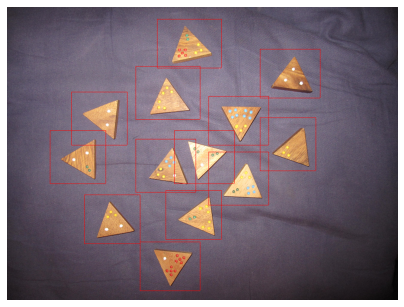

In [102]:
lmap = gen_loccol(im0, (209, 110,  80), 110)
grmap = np.zeros_like(lmap.astype(np.int))
grmap[lmap] = -1
grmap = make_share(grmap)
#print(grmap)
im3, frames = seg_to_image(img0, grmap)
img = img0
#imc = cut(img, frames[0])
#tobw(conv(imc, 10), 10)
#imc
#conv(imc, 10)
#print(tonp(conv(imc, 3)).shape)
##imcc = mask(im0, M.contrast())
imcc = mask(im0, M.hor() + M.ver())
#imcc = sobel(im0)
imcc = tobw(tobw(imcc, 0), 0)
show(imcc)
show(im3)


img_better_red = tonp(copy.copy(im0))
img_better_red[grmap != 0] = [255, 0, 0]
show(topil(img_better_red))

print(np.unique(grmap))

grmap = make_pred_unshare(grmap)
for gr in np.unique(grmap)[1:]:
    color = np.random.randint(0, 255, 3)
    #print(color)
    #img_better_red[grmap_better != 0] = [255, 0, 0]
    #img_better_red[grmap_better == 201] = [0, 255, 0]
    #img_better_red[grmap_better == 401] = [0, 0, 255]
    img_better_red[grmap == gr] = color
show(topil(img_better_red))


grmap_better = make_unshare(grmap, 40, 2) ### !!! 40, 2
img_better_red = tonp(copy.copy(im0))
for gr in np.unique(grmap_better)[1:]:
    color = np.random.randint(0, 255, 3)
    #print(color)
    #img_better_red[grmap_better != 0] = [255, 0, 0]
    #img_better_red[grmap_better == 201] = [0, 255, 0]
    #img_better_red[grmap_better == 401] = [0, 0, 255]
    img_better_red[grmap_better == gr] = color
show(topil(img_better_red))

print(np.unique(grmap_better))




im3, frames = seg_to_image(img0, grmap_better)
show(im3)

In [611]:
"""
lmap = gen_loccol(im0, (209, 110,  80), 110)
grmap = np.zeros_like(lmap.astype(np.int))
grmap[lmap] = -1
grmap = make_share(grmap)
grmap = make_unshare(grmap, 50, 4)
im3, frames = seg_to_image(img0, grmap)
img = img0

for frame in frames:
    imc = cut(img, frame)
    imcc = mask(conv(imc, 3), M.contrast())
    imcc = tobw(tobw(imcc, 10), 0)
    show(imcc)
    #imccw = incw(imcc, n=7, threshold=5)
    imccw = incw(imcc, n=8, threshold=4)
    imcd = topil(tonp(imc) * make_perimeter(imccw))
    show(imcd)
"""
;

''

# Исследование цветов точек

## Жёлтый

Image shape:  (124, 130, 3)


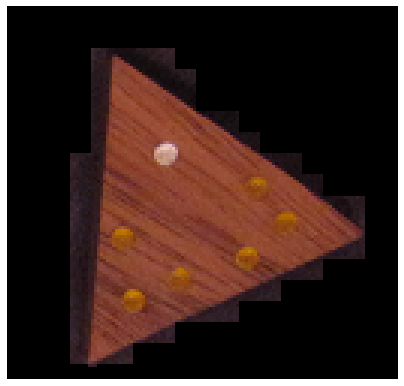

In [760]:
frame = frames[0]
imc = cut(img, frame)
imcc = mask(conv(imc, 3), M.contrast())
imcc = tobw(tobw(imcc, 10), 0)
imccw = incw(imcc, n=7, threshold=5)
imcd = topil(tonp(imc) * make_perimeter(imccw))
show(imcd)

Image shape:  (124, 130, 3)


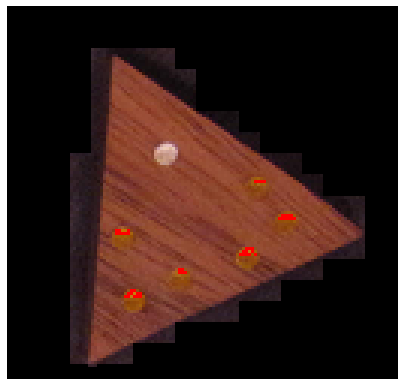

In [761]:
shape = tonp2(imcd)[0].shape
#a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (145, 125, 0), 50)]
a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (175, 115, 5), 20)]
b = np.array([(elem // shape[1], elem % shape[1]) for elem in a])
im1 = copy.copy(imcd)

for elem in b:
    im1 = putpix(im1, elem[0], elem[1], (255, 0, 0))
show(im1)

Image shape:  (124, 130, 3)


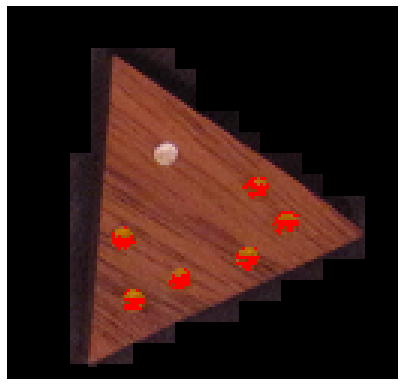

In [779]:
shape = tonp2(imcd)[0].shape
#a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (145, 125, 0), 50)]
a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (145, 85, 20), 20)]
b = np.array([(elem // shape[1], elem % shape[1]) for elem in a])
im1 = copy.copy(imcd)

for elem in b:
    im1 = putpix(im1, elem[0], elem[1], (255, 0, 0))
show(im1)

Image shape:  (124, 150, 3)


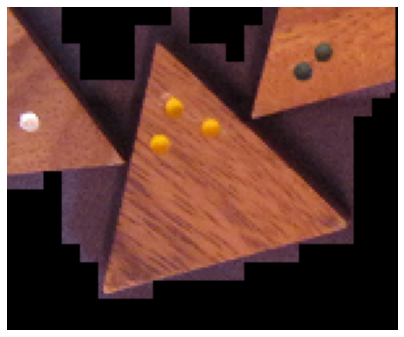

In [708]:
frame = frames[4]
imc = cut(img, frame)
imcc = mask(conv(imc, 3), M.contrast())
imcc = tobw(tobw(imcc, 10), 0)
imccw = incw(imcc, n=7, threshold=5)
imcd = topil(tonp(imc) * make_perimeter(imccw))
show(imcd)

Image shape:  (124, 150, 3)


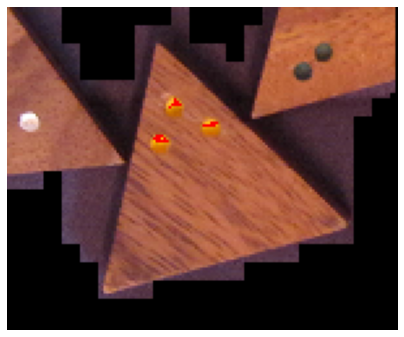

In [757]:
shape = tonp2(imcd)[0].shape
#a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (220, 190, 0), 50)]
a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (240, 180, 20), 20)]
b = np.array([(elem // shape[1], elem % shape[1]) for elem in a])
im1 = copy.copy(imcd)

for elem in b:
    im1 = putpix(im1, elem[0], elem[1], (255, 0, 0))
show(im1)

## Зелёный

Image shape:  (114, 140, 3)


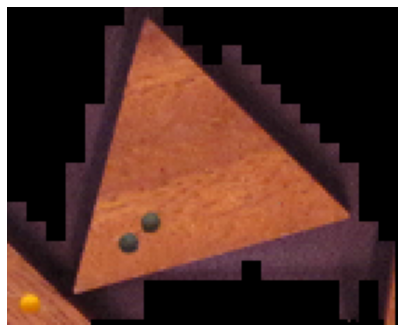

In [603]:
frame = frames[1]
imc = cut(img, frame)
imcc = mask(conv(imc, 3), M.contrast())
imcc = tobw(tobw(imcc, 10), 0)
imccw = incw(imcc, n=7, threshold=5)
imcd = topil(tonp(imc) * make_perimeter(imccw))
show(imcd)

Image shape:  (114, 140, 3)


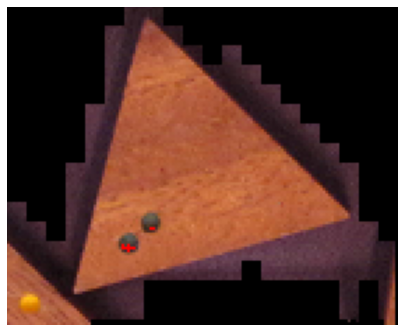

In [615]:
shape = tonp2(imcd)[0].shape
#a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (70, 70, 70), 20)]
a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (45, 55, 50), 20)]


#a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (40, 60, 40), 20)]
#a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (60, 67, 60), 20)]
#a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (40, 100, 20), 20)]
b = np.array([(elem // shape[1], elem % shape[1]) for elem in a])
im1 = copy.copy(imcd)

for elem in b:
    im1 = putpix(im1, elem[0], elem[1], (255, 0, 0))
show(im1)

Image shape:  (114, 140, 3)


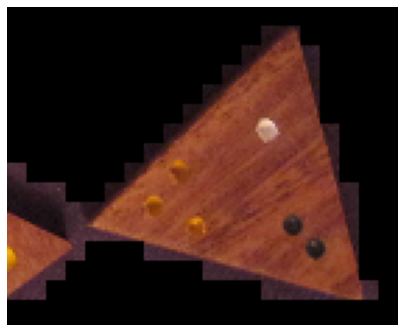

In [616]:
frame = frames[5]
imc = cut(img, frame)
imcc = mask(conv(imc, 3), M.contrast())
imcc = tobw(tobw(imcc, 10), 0)
imccw = incw(imcc, n=7, threshold=5)
imcd = topil(tonp(imc) * make_perimeter(imccw))
show(imcd)

Image shape:  (114, 140, 3)


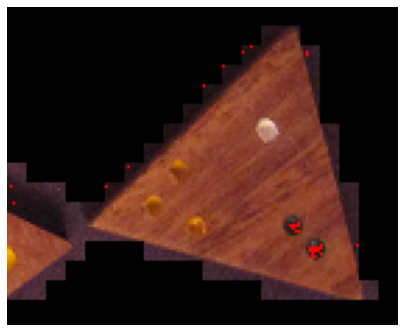

In [618]:
shape = tonp2(imcd)[0].shape
#a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (13, 38, 26), 20)]
a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (30, 45, 30), 20)]


#a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (40, 50, 40), 20)]
###a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (20, 35, 30), 15)]
#a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (0, 50, 40), 50)]
#a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (60, 67, 60), 20)]
#a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (40, 100, 20), 20)]
b = np.array([(elem // shape[1], elem % shape[1]) for elem in a])
im1 = copy.copy(imcd)

for elem in b:
    im1 = putpix(im1, elem[0], elem[1], (255, 0, 0))
show(im1)

Image shape:  (134, 140, 3)


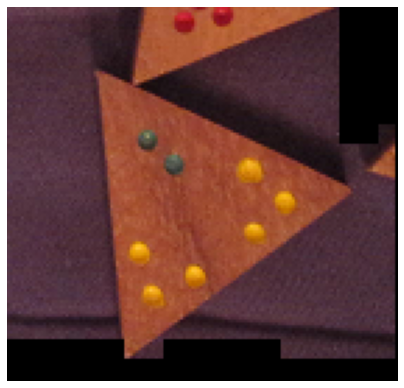

In [547]:
frame = frames[6]
imc = cut(img, frame)
imcc = mask(conv(imc, 3), M.contrast())
imcc = tobw(tobw(imcc, 10), 0)
imccw = incw(imcc, n=7, threshold=5)
imcd = topil(tonp(imc) * make_perimeter(imccw))
show(imcd)

Image shape:  (134, 140, 3)


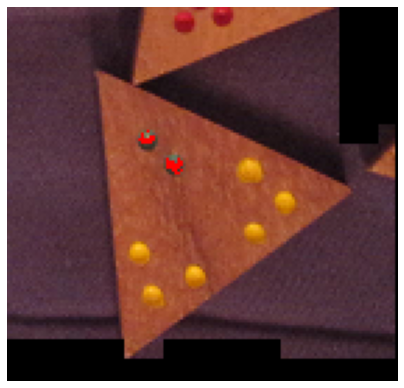

In [592]:
shape = tonp2(imcd)[0].shape
#a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (40, 90, 80), 50)]
#

#a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (50, 70, 60), 30)]
a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (70, 90, 70), 30)]
#a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (60, 70, 60), 20)]
#a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (40, 90, 80), 50)]
#a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (60, 67, 60), 20)]
#a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (40, 100, 20), 20)]
b = np.array([(elem // shape[1], elem % shape[1]) for elem in a])
im1 = copy.copy(imcd)

for elem in b:
    im1 = putpix(im1, elem[0], elem[1], (255, 0, 0))
show(im1)

## Синий

Image shape:  (114, 130, 3)


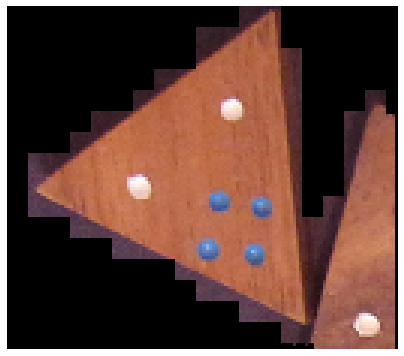

In [786]:
frame = frames[-1]
imc = cut(img, frame)
imcc = mask(conv(imc, 3), M.contrast())
imcc = tobw(tobw(imcc, 10), 0)
imccw = incw(imcc, n=7, threshold=5)
imcd = topil(tonp(imc) * make_perimeter(imccw))
show(imcd)

Image shape:  (114, 130, 3)


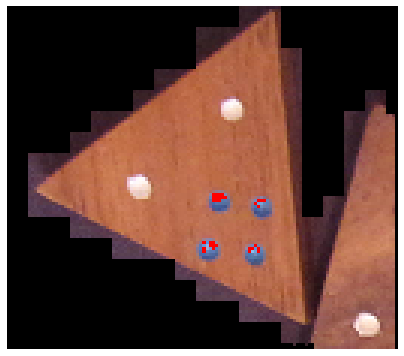

In [908]:
shape = tonp2(imcd)[0].shape
#a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (80, 120, 160), 20)]
a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (90, 140, 200), 20)]
b = np.array([(elem // shape[1], elem % shape[1]) for elem in a])
im1 = copy.copy(imcd)

for elem in b:
    im1 = putpix(im1, elem[0], elem[1], (255, 0, 0))
show(im1)

## Белый

Image shape:  (124, 130, 3)


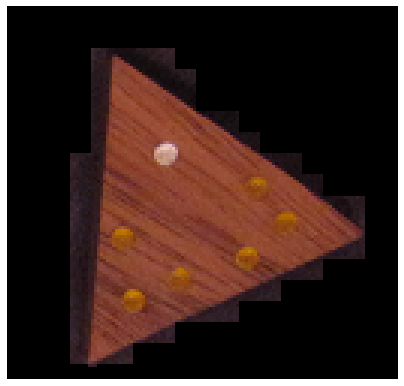

In [909]:
frame = frames[0]
imc = cut(img, frame)
imcc = mask(conv(imc, 3), M.contrast())
imcc = tobw(tobw(imcc, 10), 0)
imccw = incw(imcc, n=7, threshold=5)
imcd = topil(tonp(imc) * make_perimeter(imccw))
show(imcd)

Image shape:  (124, 130, 3)


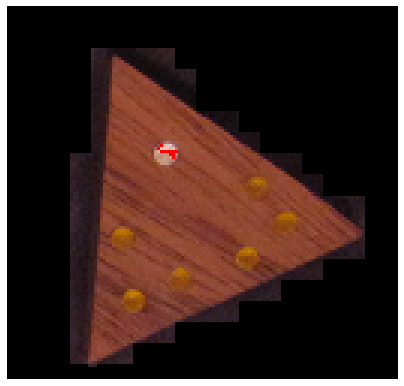

In [933]:
shape = tonp2(imcd)[0].shape
a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (200, 170, 160), 20)]
b = np.array([(elem // shape[1], elem % shape[1]) for elem in a])
im1 = copy.copy(imcd)

for elem in b:
    im1 = putpix(im1, elem[0], elem[1], (255, 0, 0))
show(im1)

Image shape:  (114, 130, 3)


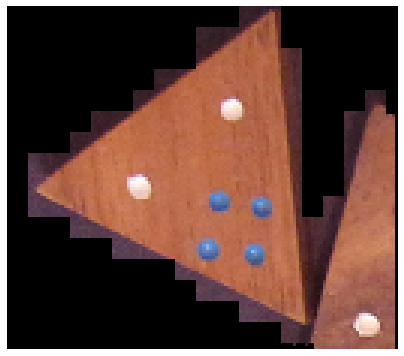

In [935]:
frame = frames[-1]
imc = cut(img, frame)
imcc = mask(conv(imc, 3), M.contrast())
imcc = tobw(tobw(imcc, 10), 0)
imccw = incw(imcc, n=7, threshold=5)
imcd = topil(tonp(imc) * make_perimeter(imccw))
show(imcd)

Image shape:  (114, 130, 3)


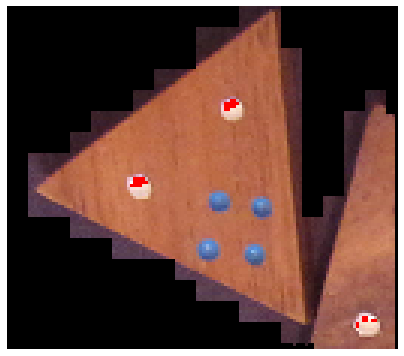

In [950]:
shape = tonp2(imcd)[0].shape
a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (250, 240, 240), 20)]
b = np.array([(elem // shape[1], elem % shape[1]) for elem in a])
im1 = copy.copy(imcd)

for elem in b:
    im1 = putpix(im1, elem[0], elem[1], (255, 0, 0))
show(im1)

## Красный

Image shape:  (124, 130, 3)


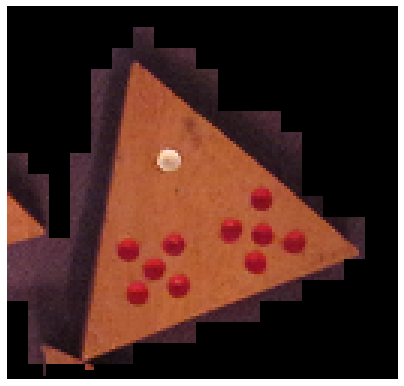

In [952]:
frame = frames[2]
imc = cut(img, frame)
imcc = mask(conv(imc, 3), M.contrast())
imcc = tobw(tobw(imcc, 10), 0)
imccw = incw(imcc, n=7, threshold=5)
imcd = topil(tonp(imc) * make_perimeter(imccw))
show(imcd)

Image shape:  (124, 130, 3)


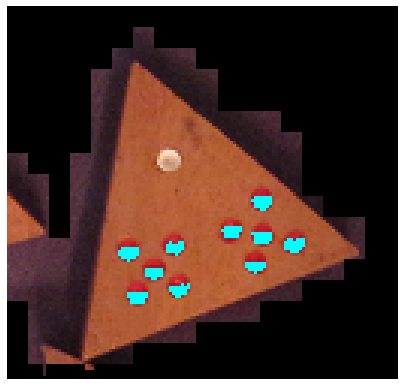

In [976]:
shape = tonp2(imcd)[0].shape
a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (140, 20, 30), 20)]
b = np.array([(elem // shape[1], elem % shape[1]) for elem in a])
im1 = copy.copy(imcd)

for elem in b:
    im1 = putpix(im1, elem[0], elem[1], (0, 255, 255))
show(im1)

In [145]:
def find_dots(image):
    """
    На вход подаётся изображение треугольника (+ ещё что-то при неудачной конкретной сегментации).
    Предполагается, что центр изображения совпадает с внутренностью целевого треугольника.
    Процедура должна определить, какие точки соответствуют данному треугольнику.
    """
    #conv_img = conv2(conv(image, 2), 2)
    conv_img = image
    #colors = {'red': [(150, 0, 0)], 'blue': [(110, 110, 180)], 'yellow': [(145, 125, 0), (220, 190, 0)], 'green': [(45, 55, 50), (70, 90, 70), (30, 45, 30)], 'white': [(170, 160, 160), (230, 220, 220)]}
    #colors = {'red': [(140, 20, 30)], 'blue': [(90, 140, 200)], 'yellow': [(145, 125, 0), (240, 180, 20)], 'green': [(45, 55, 50), (70, 90, 70), (30, 45, 30)], 'white': [(220, 180, 140), (240, 230, 230)]}
    #del colors['green']
    #colors = {'red': [(140, 20, 30)], 'blue': [(90, 140, 200)], 'yellow': [(145, 125, 0), (240, 180, 20), (175, 115, 5)], 'green': [(70, 90, 70)], 'white': [(220, 180, 140), (240, 230, 230)]}
    #colors = {'red': [(170, 20, 30)], 'blue': [(90, 140, 200)], 'yellow': [(155, 125, 20), (240, 180, 20), (175, 115, 5)], 'green': [(70, 90, 70), (45, 55, 50)], 'white': [(220, 180, 140), (240, 230, 230)]}
    #del colors['green']
    colors = {'red': [(170, 20, 30)], 'blue': [(90, 140, 200)], 'yellow': [(155, 125, 20), (240, 180, 20), (175, 115, 5)], 'green': [(70, 90, 70), (45, 55, 50)], 'white': [(220, 200, 200), (240, 230, 230)]}
    #del colors['yellow']
    #del colors['red']
    #del colors['white']
    #colors = {'red': [(170, 20, 30)], 'blue': [(90, 140, 200)], 'yellow': [(155, 125, 20), (240, 180, 20), (175, 115, 5)], 'green': [(70, 90, 70), (45, 55, 50)], 'white': [(240, 230, 230)]}
    array = tonp(conv_img)
    array[array[:, :] == [255, 0, 0]][0] = 0
    array[array[:, :] == [255, 0, 0]][1] = 0
    array[array[:, :] == [255, 0, 0]][2] = 0
    for color in colors:
        color_array = copy.copy(array)
        for c in colors[color]:
            color_array[gen_loccol(conv_img, c, 40)] = [255, 0, 0]
            #mask = (color_array[:, :, 2] > color_array[:, :, 0].astype(int) + 25) * (color_array[:, :, 2] > color_array[:, :, 1].astype(int) + 25) ### !!!
            #color_array[mask] = [255, 0, 0] ### !!!
            array = color_array
    return topil(array)

Image shape:  (124, 140, 3)


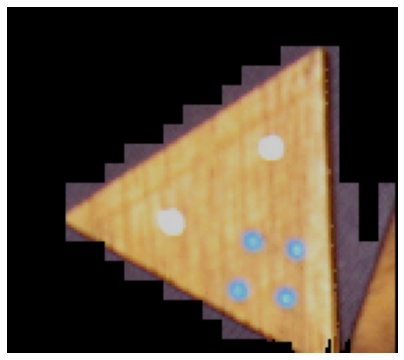

Image shape:  (124, 140, 3)


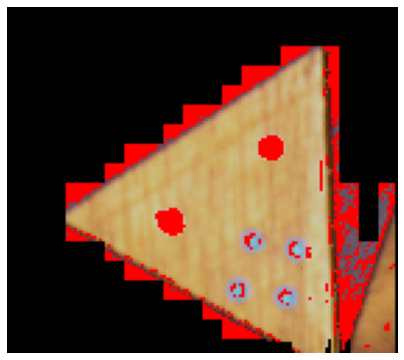

In [146]:
frame = frames[2]
imc = cut(unbright2(img), frame)
imcc = mask(conv(imc, 3), M.contrast())
imcc = tobw(tobw(imcc, 10), 0)
imccw = incw(imcc, n=7, threshold=5)
imcd = topil(tonp(imc) * make_perimeter(imccw))
show(imcd)
show(find_dots(imcd))

Image shape:  (134, 150, 3)


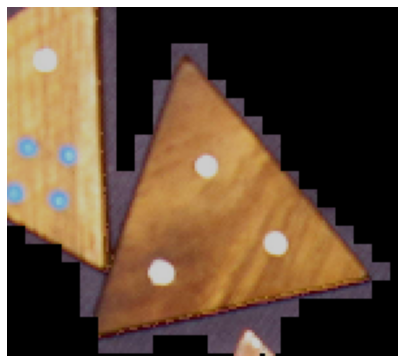

Image shape:  (134, 150, 3)


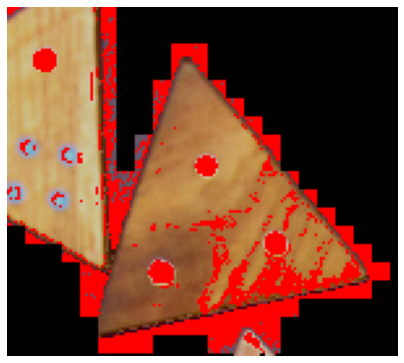

In [418]:
frame = frames[5] #156
imc = cut(unbright2(img), frame)
imcc = mask(conv(imc, 3), M.contrast())
imcc = tobw(tobw(imcc, 10), 0)
imccw = incw(imcc, n=7, threshold=5)
imcd = topil(tonp(imc) * make_perimeter(imccw))
show(imcd)
show(find_dots(imcd))

Image shape:  (144, 150, 3)


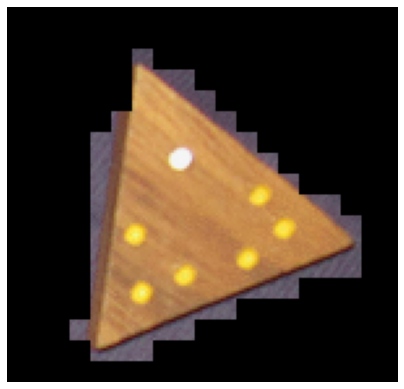

Image shape:  (144, 150, 3)


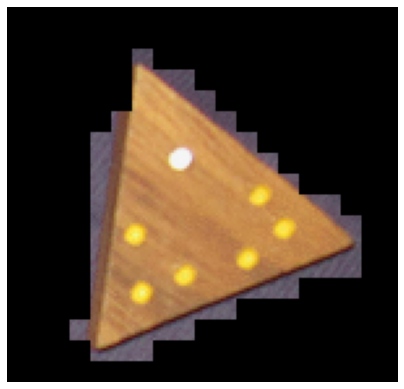

Image shape:  (134, 130, 3)


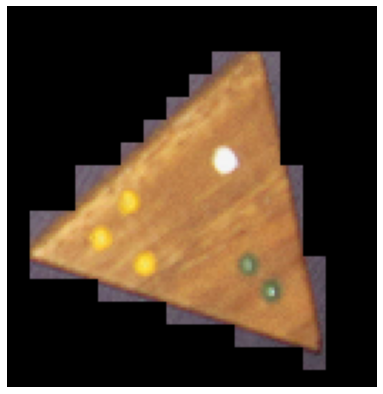

Image shape:  (134, 130, 3)


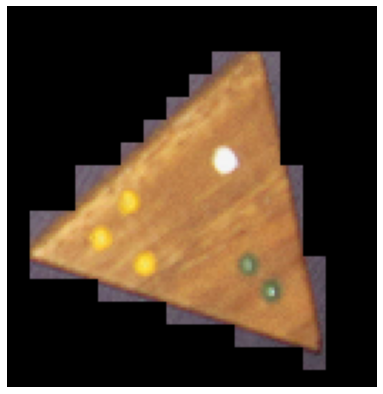

Image shape:  (124, 140, 3)


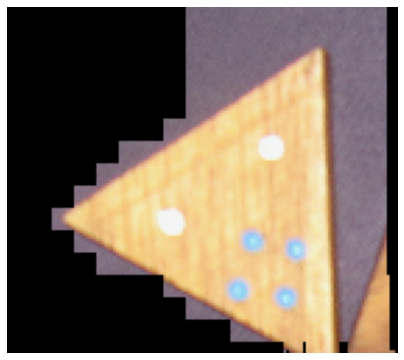

Image shape:  (124, 140, 3)


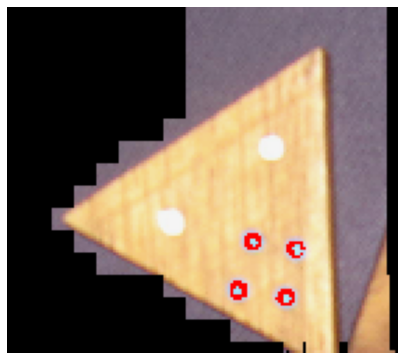

Image shape:  (134, 150, 3)


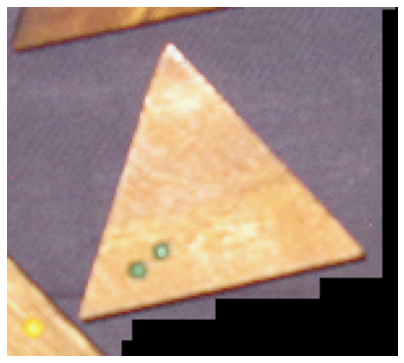

Image shape:  (134, 150, 3)


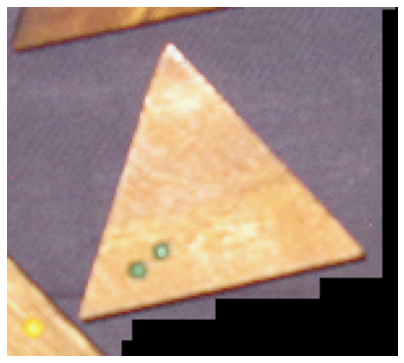

Image shape:  (124, 140, 3)


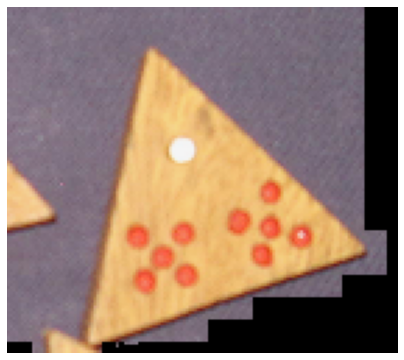

Image shape:  (124, 140, 3)


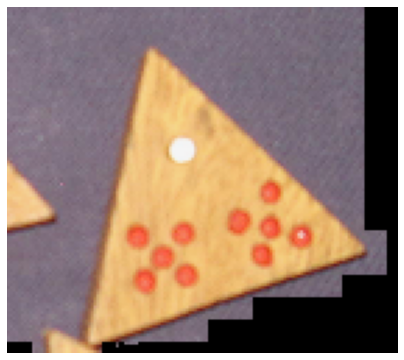

Image shape:  (134, 150, 3)


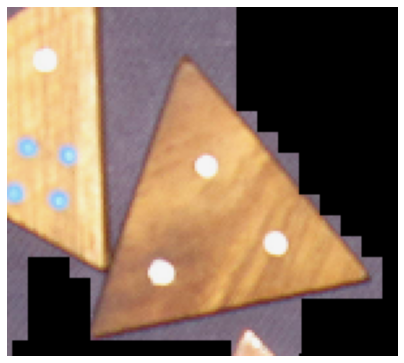

Image shape:  (134, 150, 3)


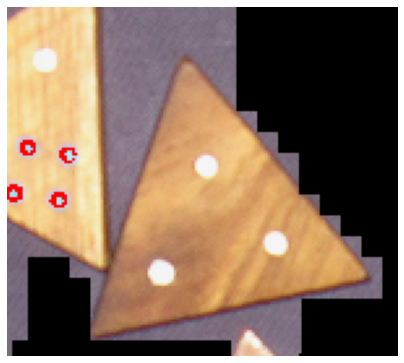

Image shape:  (124, 140, 3)


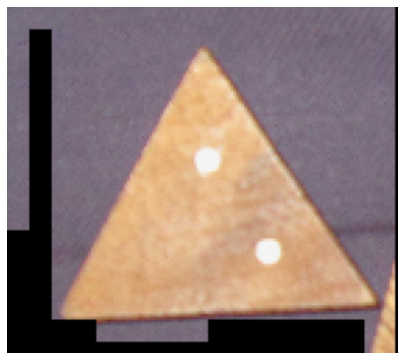

Image shape:  (124, 140, 3)


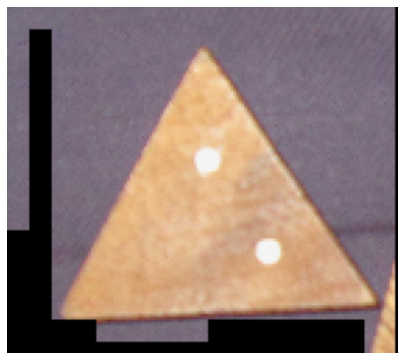

Image shape:  (104, 120, 3)


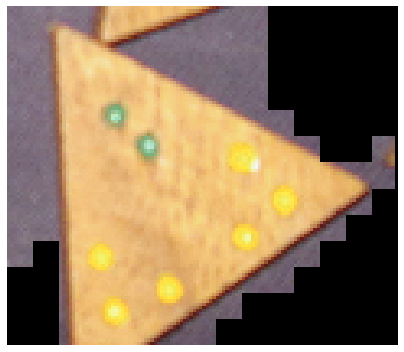

Image shape:  (104, 120, 3)


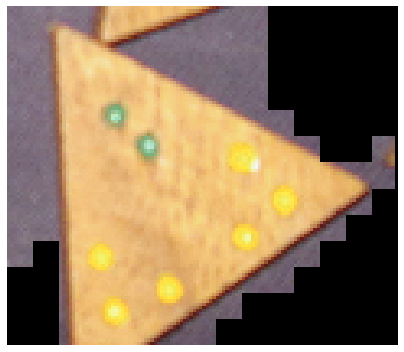

Image shape:  (114, 150, 3)


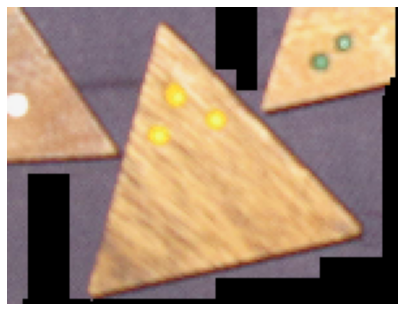

Image shape:  (114, 150, 3)


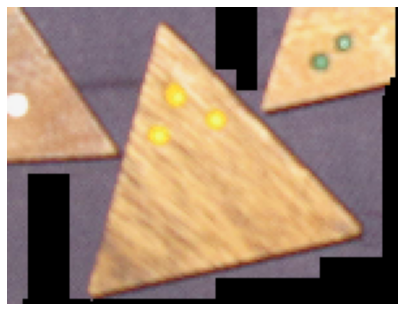

In [410]:
for frame in frames:
    #imc = cut(img, frame)
    imc = unbright2(cut(img, frame), threshold=80, delta=10)
    imcc = mask(conv(imc, 3), M.contrast())
    imcc = tobw(tobw(imcc, 10), 0)
    #imccw = incw(imcc, n=7, threshold=5)
    imccw = incw(imcc, n=8, threshold=4)
    imcd = topil(tonp(imc) * make_perimeter(imccw))
    show(imcd)
    show(find_dots(imcd))

In [231]:
def find_dots2(image):
    """
    На вход подаётся изображение треугольника (+ ещё что-то при неудачной конкретной сегментации).
    Предполагается, что центр изображения совпадает с внутренностью целевого треугольника.
    Процедура должна определить, какие точки соответствуют данному треугольнику.
    """
    #array = tonp(image)
    imcc = mask(conv(image, 3), M.contrast())
    #imcc = mask(mask(conv(image, 2), M.hor()), M.ver())
    #imcc = mask(image, M.sobel1(), threshold = 100)
    #imcc = mask(mask(image, M.sobel1()), M.sobel2())
    #imcc = sobel(image, conv_level=3)
    imcc = tobw(tobw(imcc, 150), 0)
    return imcc

Image shape:  (114, 150, 3)


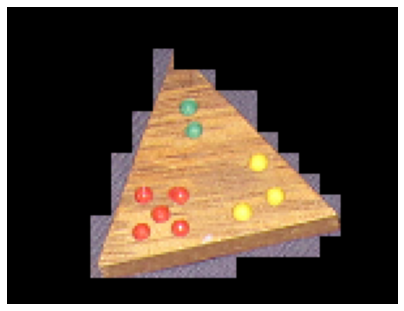

Image shape:  (114, 150, 3)


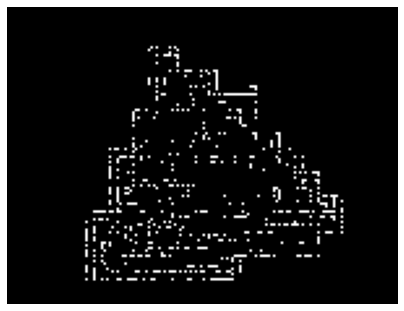

Image shape:  (104, 120, 3)


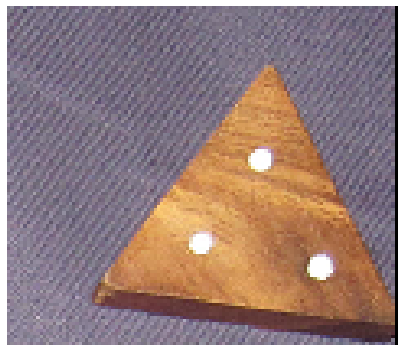

Image shape:  (104, 120, 3)


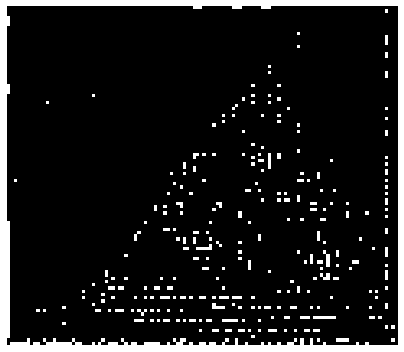

Image shape:  (114, 150, 3)


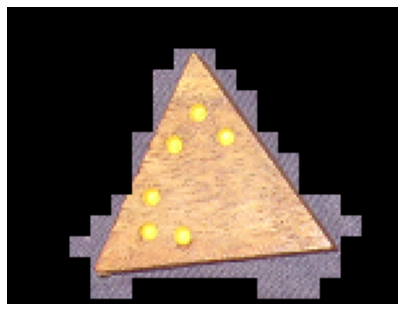

Image shape:  (114, 150, 3)


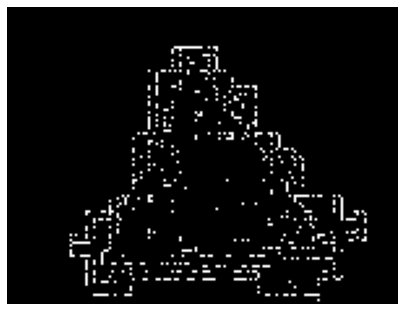

Image shape:  (124, 130, 3)


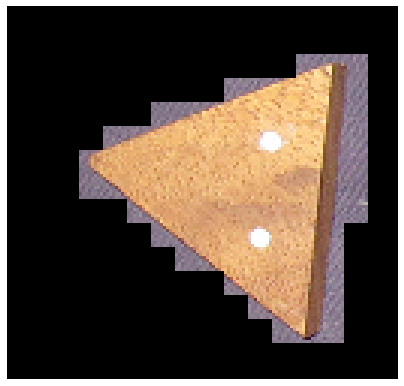

Image shape:  (124, 130, 3)


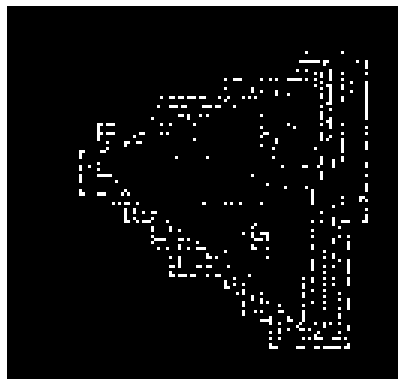

Image shape:  (114, 140, 3)


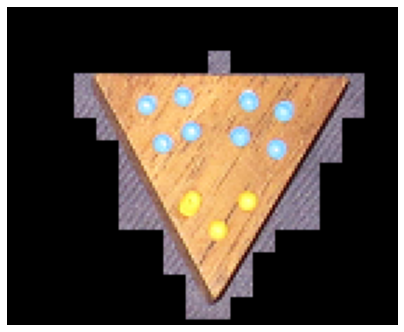

Image shape:  (114, 140, 3)


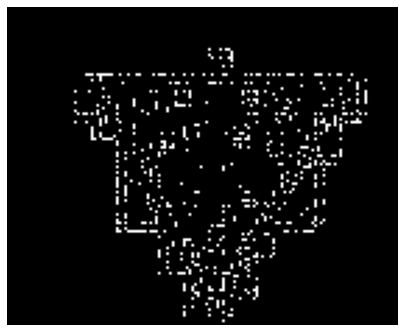

Image shape:  (114, 130, 3)


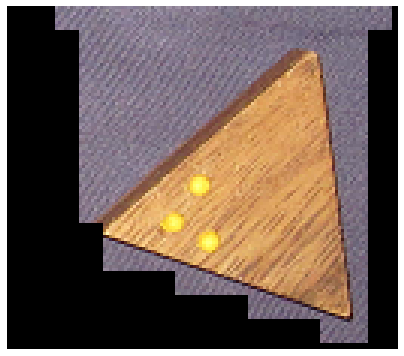

Image shape:  (114, 130, 3)


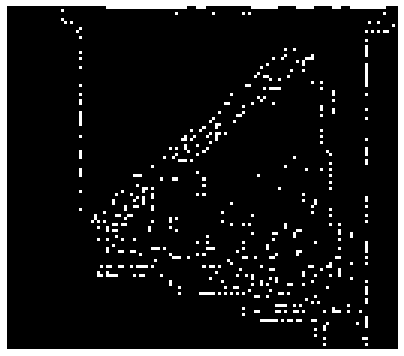

Image shape:  (124, 130, 3)


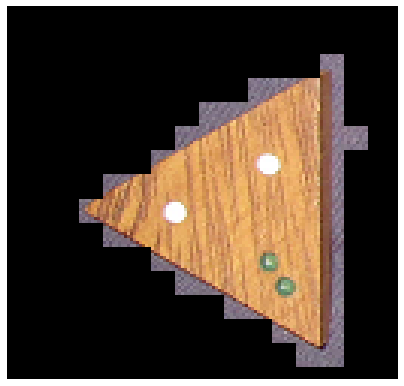

Image shape:  (124, 130, 3)


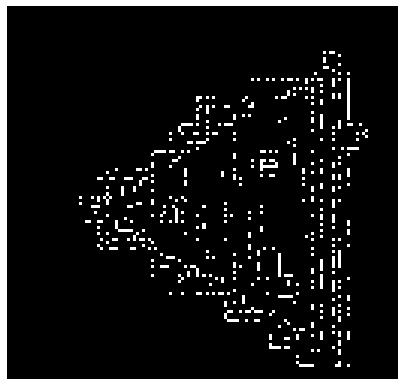

Image shape:  (124, 140, 3)


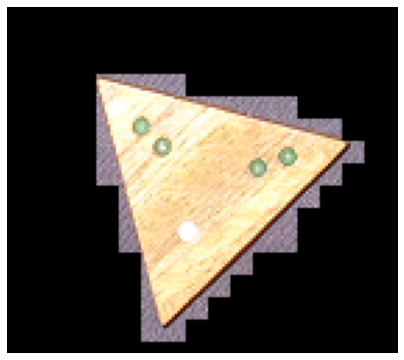

Image shape:  (124, 140, 3)


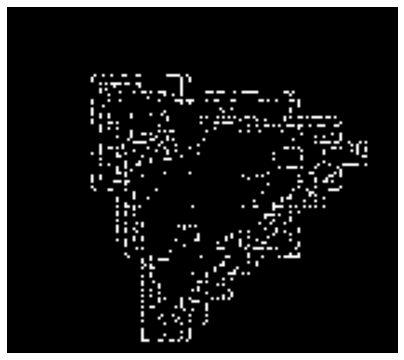

Image shape:  (114, 140, 3)


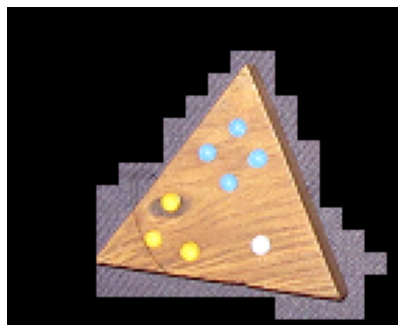

Image shape:  (114, 140, 3)


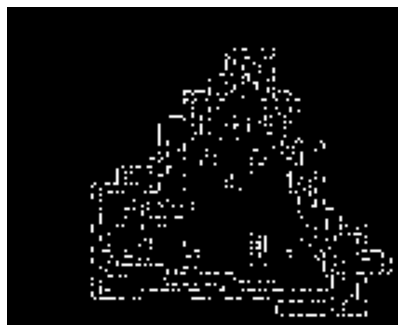

Image shape:  (124, 140, 3)


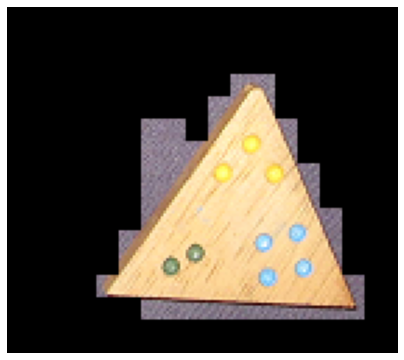

Image shape:  (124, 140, 3)


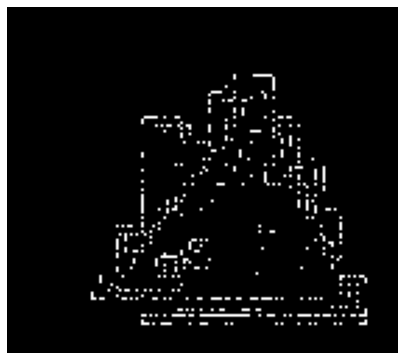

Image shape:  (114, 130, 3)


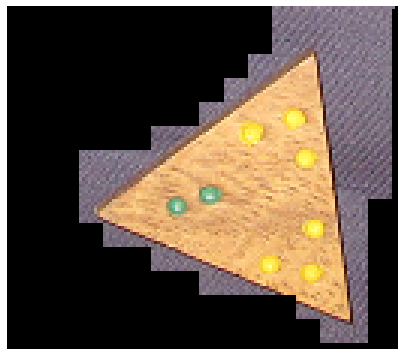

Image shape:  (114, 130, 3)


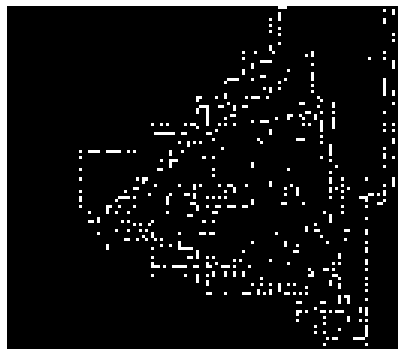

Image shape:  (104, 120, 3)


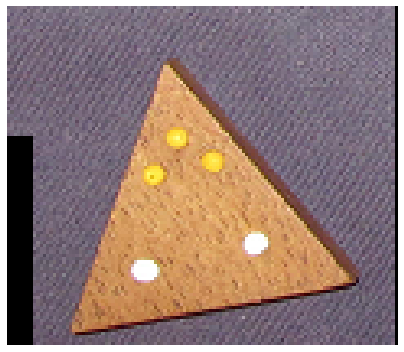

Image shape:  (104, 120, 3)


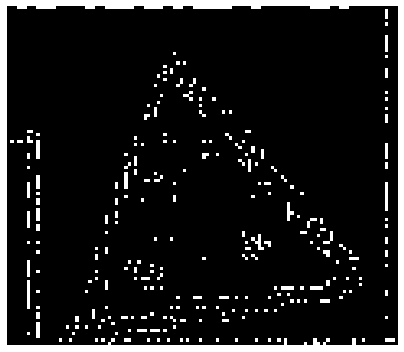

Image shape:  (104, 130, 3)


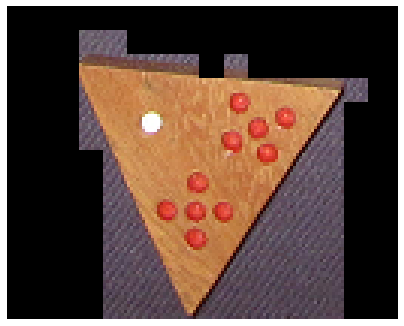

Image shape:  (104, 130, 3)


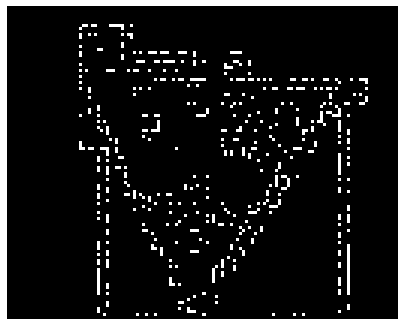

In [232]:
for frame in frames:
    imc = cut(img, frame)
    imcc = mask(conv(imc, 3), M.contrast())
    imcc = tobw(tobw(imcc, 10), 0)
    #imccw = incw(imcc, n=7, threshold=5)
    imccw = incw(imcc, n=8, threshold=4)
    imcd = topil(tonp(imc) * make_perimeter(imccw))
    show(imcd)
    show(find_dots2(imcd))

In [18]:
def find_dots3(image, brightened=False):
    """
    На вход подаётся изображение треугольника (+ ещё что-то при неудачной конкретной сегментации).
    Предполагается, что центр изображения совпадает с внутренностью целевого треугольника.
    Процедура должна определить, какие точки соответствуют данному треугольнику.
    """
    array = tonp(image)
    color_array = copy.copy(array)
    # blue
    #mask = (color_array[:, :, 2] > color_array[:, :, 0].astype(int) + 25) * (color_array[:, :, 2] > color_array[:, :, 1].astype(int) + 25) ### !!!
    # green
    ##mask = (color_array[:, :, 1] > (color_array[:, :, 0].astype(int)) + 10) * (color_array[:, :, 1] > (color_array[:, :, 2].astype(int)) + 10) ### !!!
    #mask = (color_array[:, :, 1] > (color_array[:, :, 0].astype(int) + color_array[:, :, 2].astype(int)) * 2 / 3) ### !!!
    # triangle !!!
    #triangle_mask = (color_array[:, :, 0].astype(int) + color_array[:, :, 1].astype(int) // 2 > (color_array[:, :, 2].astype(int)) + 70) ### !!!
    #triangle_mask = (color_array[:, :, 0].astype(int) + color_array[:, :, 1].astype(int) // 2 > (color_array[:, :, 2].astype(int)) + 120) ### !!!
    # yellow
    #mask = (color_array[:, :, 0].astype(int) + color_array[:, :, 1].astype(int) // 2 > (color_array[:, :, 2].astype(int)) + 250) ### !!!
    # red
    #mask = (color_array[:, :, 0].astype(int) > (color_array[:, :, 1].astype(int) + color_array[:, :, 2].astype(int)) * 2 / 3 + 100) ### !!!
    # white
    #mask = (np.abs(color_array[:, :, 0].astype(int) - color_array[:, :, 1].astype(int)) < 3) *  (np.abs(color_array[:, :, 0].astype(int) - color_array[:, :, 2].astype(int)) < 3) * (color_array[:, :, 0].astype(int) > 180) ### !!!
    
    """colors = {'blue'  : (color_array[:, :, 2] > color_array[:, :, 0].astype(int) + 25) * (color_array[:, :, 2] > color_array[:, :, 1].astype(int) + 25),
              'green' : (color_array[:, :, 1] > (color_array[:, :, 0].astype(int)) + 10) * (color_array[:, :, 1] > (color_array[:, :, 2].astype(int)) + 1),
              'yellow': (color_array[:, :, 0].astype(int) + color_array[:, :, 1].astype(int) // 2 > (color_array[:, :, 2].astype(int)) + 250),
              'red'   : (color_array[:, :, 0].astype(int) > (color_array[:, :, 1].astype(int) + color_array[:, :, 2].astype(int)) * 2 / 3 + 100),
              'white' : (np.abs(color_array[:, :, 0].astype(int) - color_array[:, :, 1].astype(int)) < 3) *  (np.abs(color_array[:, :, 0].astype(int) - color_array[:, :, 2].astype(int)) < 3) * (color_array[:, :, 0].astype(int) > 180)
             }"""
    
    """colors = {'blue'  : (color_array[:, :, 2] > color_array[:, :, 0].astype(int) + 20) * (color_array[:, :, 2] > color_array[:, :, 1].astype(int) + 20),
              'green' : (color_array[:, :, 1] > (color_array[:, :, 0].astype(int)) - 10) * (color_array[:, :, 1] > (color_array[:, :, 2].astype(int)) - 10) * (color_array[:, :, 0].astype(int) + color_array[:, :, 1].astype(int) + color_array[:, :, 2].astype(int) > 10),
              'yellow': (color_array[:, :, 0].astype(int) + color_array[:, :, 1].astype(int) // 2 > (color_array[:, :, 2].astype(int)) + 220),
              'red'   : (color_array[:, :, 0].astype(int) > (color_array[:, :, 1].astype(int) + color_array[:, :, 2].astype(int)) * 2 / 3 + 120),
              'white' : (np.abs(color_array[:, :, 0].astype(int) - color_array[:, :, 1].astype(int)) < 10) *  (np.abs(color_array[:, :, 0].astype(int) - color_array[:, :, 2].astype(int)) < 10) * (color_array[:, :, 0].astype(int) > 220)
             }"""
    
    """colors = {'blue'  : (color_array[:, :, 2] > color_array[:, :, 0].astype(int) + 20) * (color_array[:, :, 2] > color_array[:, :, 1].astype(int) + 20),
              'green' : (color_array[:, :, 1] > (color_array[:, :, 0].astype(int)) + 1) * (color_array[:, :, 1] > (color_array[:, :, 2].astype(int)) + 1),
              'yellow': (color_array[:, :, 0].astype(int) + color_array[:, :, 1].astype(int) // 2 > (color_array[:, :, 2].astype(int)) + 220),
              'red'   : (color_array[:, :, 0].astype(int) > (color_array[:, :, 1].astype(int) + color_array[:, :, 2].astype(int)) * 2 / 3 + 100),
              'white' : (np.abs(color_array[:, :, 0].astype(int) - color_array[:, :, 1].astype(int)) < 3) *  (np.abs(color_array[:, :, 0].astype(int) - color_array[:, :, 2].astype(int)) < 3) * (color_array[:, :, 0].astype(int) > 180)
             }""" ### !!! good
    if brightened == False:
        triangle_mask = (color_array[:, :, 0].astype(int) + color_array[:, :, 1].astype(int) // 2 > (color_array[:, :, 2].astype(int)) + 70)
        colors = {'blue'  : (color_array[:, :, 2] > color_array[:, :, 0].astype(int) + 20) * (color_array[:, :, 2] > color_array[:, :, 1].astype(int) + 20),
                  'green' : (color_array[:, :, 1] > (color_array[:, :, 0].astype(int)) + 1) * (color_array[:, :, 1] > (color_array[:, :, 2].astype(int)) + 1),
                  'yellow': (color_array[:, :, 0].astype(int) + color_array[:, :, 1].astype(int) // 2 > (color_array[:, :, 2].astype(int)) + 220),
                  'red'   : (color_array[:, :, 0].astype(int) > (color_array[:, :, 1].astype(int) + color_array[:, :, 2].astype(int)) * 2 / 3 + 100),
                  'white' : (np.abs(color_array[:, :, 0].astype(int) - color_array[:, :, 1].astype(int)) < 3) *  (np.abs(color_array[:, :, 0].astype(int) - color_array[:, :, 2].astype(int)) < 3) * (color_array[:, :, 0].astype(int) > 180)
                 } ### !!! good
    else:
        triangle_mask = (color_array[:, :, 0].astype(int) + color_array[:, :, 1].astype(int) // 2 > (color_array[:, :, 2].astype(int)) + 120)
        colors = {'blue'  : (color_array[:, :, 2] > color_array[:, :, 0].astype(int) + 20) * (color_array[:, :, 2] > color_array[:, :, 1].astype(int) + 20),
                  #'green' : (color_array[:, :, 1] > (color_array[:, :, 0].astype(int)) - 15) * (color_array[:, :, 1] > (color_array[:, :, 2].astype(int)) - 30) * (color_array[:, :, 1].astype(int) > 0),
                  'green' : (color_array[:, :, 1] > (color_array[:, :, 0].astype(int)) - 20) * (color_array[:, :, 1] > (color_array[:, :, 2].astype(int)) - 50) * (color_array[:, :, 1].astype(int) > 110),
                  #'green' : ((color_array[:, :, 1] + color_array[:, :, 2].astype(int)) * 5 // 9 > color_array[:, :, 0].astype(int)),
                  #'green' : ((color_array[:, :, 0].astype(int) - 113) ** 2 + (color_array[:, :, 1].astype(int) - 142) ** 2 + (color_array[:, :, 2].astype(int) - 109) ** 2 <= 50 ** 2),
                  'yellow': (color_array[:, :, 0].astype(int) + color_array[:, :, 1].astype(int) // 2 > (color_array[:, :, 2].astype(int)) + 220),
                  'red'   : (color_array[:, :, 0].astype(int) > (color_array[:, :, 1].astype(int) + color_array[:, :, 2].astype(int)) * 2 / 3 + 70),
                  'white' : (np.abs(color_array[:, :, 0].astype(int) - color_array[:, :, 1].astype(int)) < 5) *  (np.abs(color_array[:, :, 0].astype(int) - color_array[:, :, 2].astype(int)) < 5) * (color_array[:, :, 0].astype(int) > 180)
                 } ### last
    array[array[:, :] == [255, 0, 0]][0] = 0
    array[array[:, :] == [255, 0, 0]][1] = 0
    array[array[:, :] == [255, 0, 0]][2] = 0
    color_array[triangle_mask] = [255, 0, 255]
    for color in colors:
        color_array[colors[color]] = [255, 0, 0] ### !!!
        #color_array[mask] = [255, 0, 0]
        array = color_array
    #print(np.where(color_array[:, :] == [255,0,0]))
    return topil(array)

In [47]:
def find_dots3_to_arr(image, brightened=False):
    array = tonp(image)
    res = np.zeros_like(array[:, :, 0]).astype(int)
    color_dict = {'blue': 4, 'green': 2, 'yellow': 3, 'red': 5, 'white': 1}
    if brightened == False:
        triangle_mask = (array[:, :, 0].astype(int) + array[:, :, 1].astype(int) // 2 > (array[:, :, 2].astype(int)) + 70)
        colors = {'blue'  : (array[:, :, 2] > array[:, :, 0].astype(int) + 20) * (array[:, :, 2] > array[:, :, 1].astype(int) + 20),
                  'green' : (array[:, :, 1] > (array[:, :, 0].astype(int)) + 1) * (array[:, :, 1] > (array[:, :, 2].astype(int)) + 1),
                  'yellow': (array[:, :, 0].astype(int) + array[:, :, 1].astype(int) // 2 > (array[:, :, 2].astype(int)) + 220),
                  'red'   : (array[:, :, 0].astype(int) > (array[:, :, 1].astype(int) + array[:, :, 2].astype(int)) * 2 / 3 + 100),
                  'white' : (np.abs(array[:, :, 0].astype(int) - array[:, :, 1].astype(int)) < 3) *  (np.abs(array[:, :, 0].astype(int) - array[:, :, 2].astype(int)) < 3) * (array[:, :, 0].astype(int) > 180)
                 } 
    else:
        triangle_mask = (array[:, :, 0].astype(int) + array[:, :, 1].astype(int) // 2 > (array[:, :, 2].astype(int)) + 120)
        colors = {'blue'  : (array[:, :, 2] > array[:, :, 0].astype(int) + 20) * (array[:, :, 2] > array[:, :, 1].astype(int) + 20),
                  'green' : (array[:, :, 1] > (array[:, :, 0].astype(int)) - 20) * (array[:, :, 1] > (array[:, :, 2].astype(int)) - 20) * (array[:, :, 1].astype(int) > 110) * (array[:, :, 1].astype(int) < 200),
                  'yellow': (array[:, :, 0].astype(int) + array[:, :, 1].astype(int) // 2 > (array[:, :, 2].astype(int)) + 220),
                  'red'   : (array[:, :, 0].astype(int) > (array[:, :, 1].astype(int) + array[:, :, 2].astype(int)) * 2 / 3 + 80),
                  'white' : (np.abs(array[:, :, 0].astype(int) - array[:, :, 1].astype(int)) < 20) *  (np.abs(array[:, :, 0].astype(int) - array[:, :, 2].astype(int)) < 30) * (array[:, :, 0].astype(int) > 180) * (array[:, :, 1].astype(int) > 180) * (array[:, :, 2].astype(int) > 180)
                 } 
    res[triangle_mask] = -1
    for color in colors:
        res[colors[color]] = color_dict[color]
    return res


def group_dots(array):
    for k in range(4):
        array_buf = copy.copy(array)
        for i in range(1, array.shape[0] - 1):
            for j in range(1, array.shape[1] - 1):
                x_itself = np.array([array_buf[i-1, j], array_buf[i+1, j], array_buf[i, j-1], array_buf[i, j+1]])
                if np.any(x_itself == 0):
                    array[i, j] = 0
    return array

def make_perimeter_to_arr(array):
    arr = copy.copy(array)
    x_ind = arr.shape[1] // 2
    u_ind = d_ind = arr.shape[0] // 2
    while np.all(arr[u_ind, x_ind] == 0) and u_ind > 0:
        u_ind -= 1
    while np.all(arr[u_ind, x_ind] != 0) and u_ind > 0:
        u_ind -= 1
    u_ind += 1
    while np.all(arr[d_ind, x_ind] == 0) and d_ind < arr.shape[0] - 1:
        d_ind += 1
    while np.all(arr[d_ind, x_ind] != 0) and d_ind > arr.shape[0] - 1:
        d_ind += 1
    d_ind -= 1
    
    base_u_ind = u_ind
    base_d_ind = d_ind
    #print('base:', base_u_ind, base_d_ind)
    
    for k0 in range(2):
        for k in range(-1, 2, 2):
            #u_ind = base_u_ind
            #d_ind = base_d_ind
            #x_ind = arr.shape[1] // 2
            #print(arr.shape)
            while np.any(arr[u_ind:d_ind+1, x_ind] != 0) and 0 <= x_ind < arr.shape[1] - 1:
                #print(d_ind, u_ind, x_ind)
                while np.all(arr[u_ind, x_ind] != 0) and u_ind > 0:
                    u_ind -= 1
                while np.all(arr[u_ind, x_ind] == 0) and u_ind < arr.shape[0] - 1:
                    u_ind += 1

                while np.all(arr[d_ind, x_ind] != 0) and d_ind < arr.shape[0] - 1:
                    d_ind += 1
                while np.all(arr[d_ind, x_ind] == 0) and d_ind > 0:
                    d_ind -= 1
                #print(x_ind, u_ind, d_ind)
                arr[u_ind:d_ind+1, x_ind] = -2
                x_ind += k
            x_ind -= k
    
    arr[arr != -2] = 0
    arr[arr == -2] = 1
    #print(arr)
    #return topil(arr.astype(np.uint8))
    return arr.astype(np.uint8)

def delete_rouges(array):
    array_buf = copy.copy(array)
    for i in range(1, array.shape[0] - 2):
        for j in range(1, array.shape[1] - 2):
            gr = array_buf[i, j]
            x_itself = np.array([array_buf[i-2, j], array_buf[i+2, j], array_buf[i, j-2], array_buf[i, j+2]])
            if np.all(x_itself != gr):
                array[i, j] = 0
    return array

def unite_groups(array, radius=10):
    k = 1
    for i in range(array.shape[0]):
        for j in range(array.shape[1]):
            if 0 < array[i, j] < 100:
                val = array[i, j]
                spread(array, i, j, val + k * 100)
                for i0 in range(max(-2+i, 0), min(radius+i, array.shape[0])):
                    for j0 in range(max(-2+j, 0), min(radius+j, array.shape[1])):
                        if array[i0, j0] == val:
                            spread(array, i0, j0, val + k * 100)
                k += 1
    color_dict = {'blue': 4, 'green': 2, 'yellow': 3, 'red': 5, 'white': 1}
    for color in color_dict:
        maxima = np.max(np.concatenate((array[array % 100 == color_dict[color]], np.zeros(1))))
        print(color, ':', maxima)
        
        
        
def unite_groups2(array, radius=10):
    color_dict = {'blue': 4, 'green': 2, 'yellow': 3, 'red': 5, 'white': 1}
    gr_color = {}
    for color in color_dict:
        k = 1
        while np.any(array == color_dict[color]):
            first = np.where(array == color_dict[color])
            first = np.array([first[0][0], first[1][0]])
            spread(array, first[0], first[1], color_dict[color] + k * 100)
            k += 1
        gr_color[color] = k - 1
    return gr_color

In [48]:
min(1, 2)

1

Image shape:  (114, 150, 3)


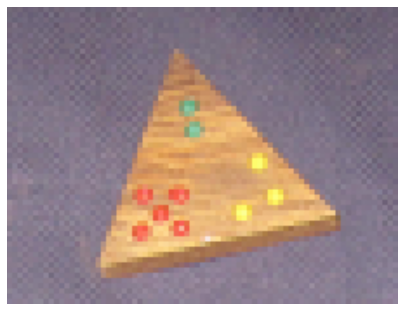

Image shape:  (114, 150, 3)


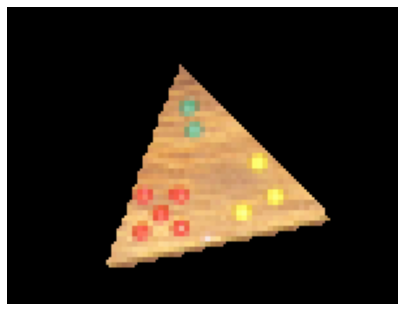

Image shape:  (114, 150, 3)


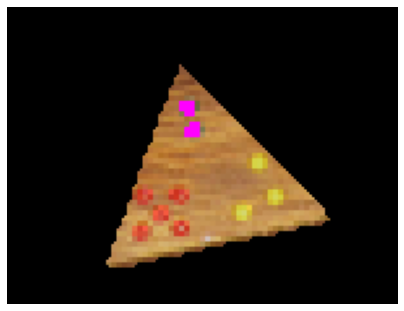

Image shape:  (114, 150, 3)


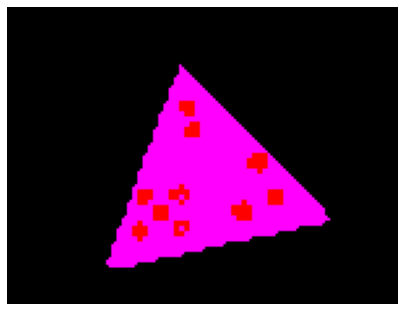

85 425 {'blue': 0, 'green': 2, 'yellow': 3, 'red': 5, 'white': 0}
Image shape:  (114, 140, 3)


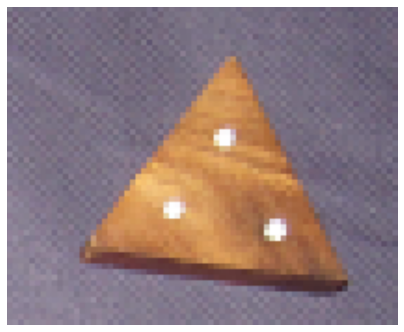

Image shape:  (114, 140, 3)


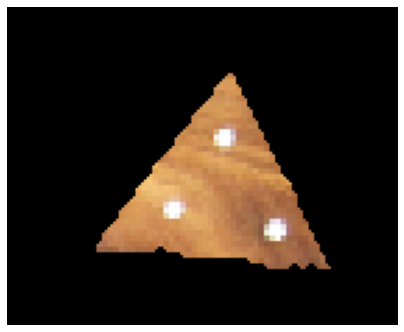

Image shape:  (114, 140, 3)


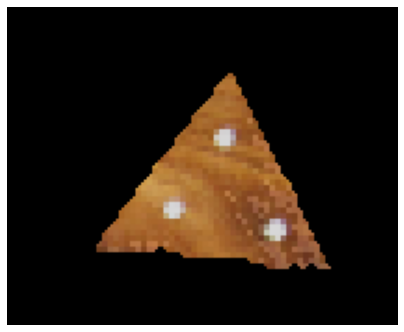

Image shape:  (114, 140, 3)


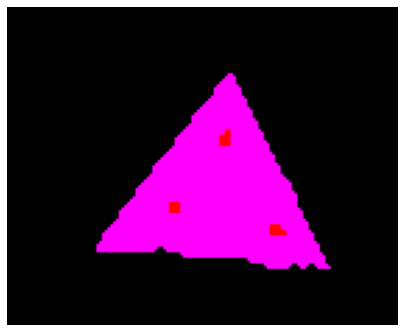

155 660 {'blue': 0, 'green': 0, 'yellow': 0, 'red': 0, 'white': 3}
Image shape:  (124, 150, 3)


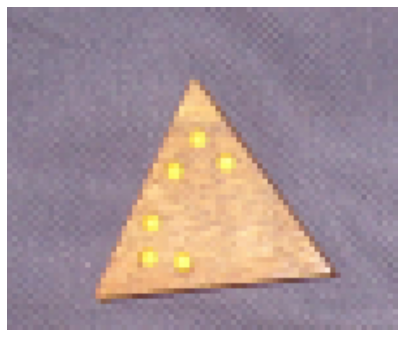

Image shape:  (124, 150, 3)


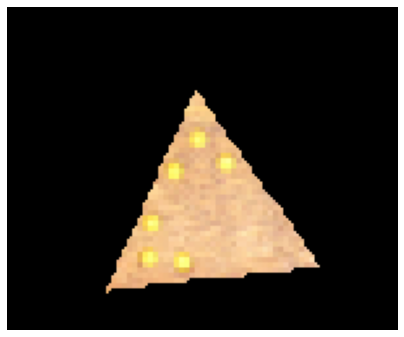

Image shape:  (124, 150, 3)


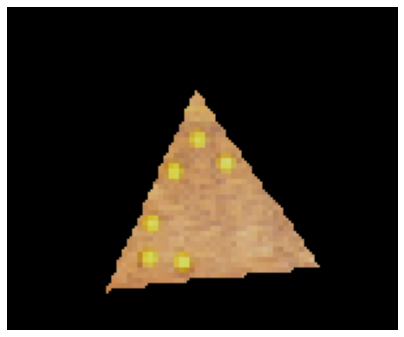

Image shape:  (124, 150, 3)


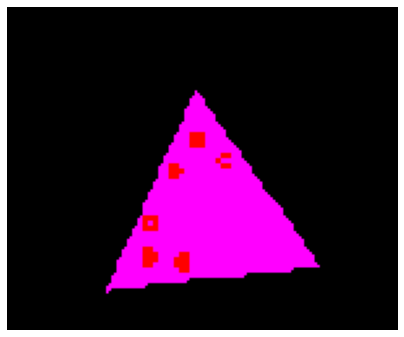

200 375 {'blue': 0, 'green': 0, 'yellow': 7, 'red': 0, 'white': 0}
Image shape:  (124, 130, 3)


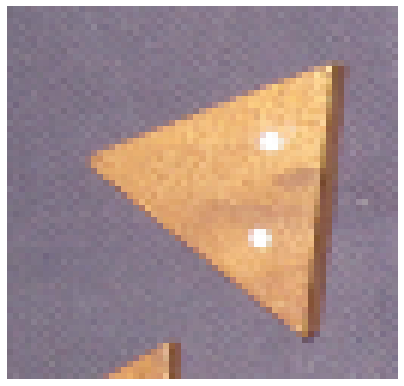

Image shape:  (124, 130, 3)


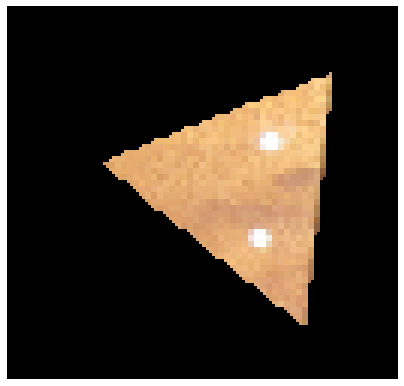

Image shape:  (124, 130, 3)


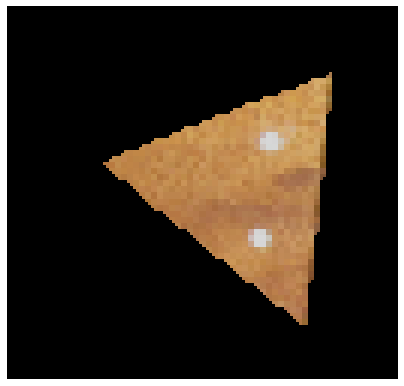

Image shape:  (124, 130, 3)


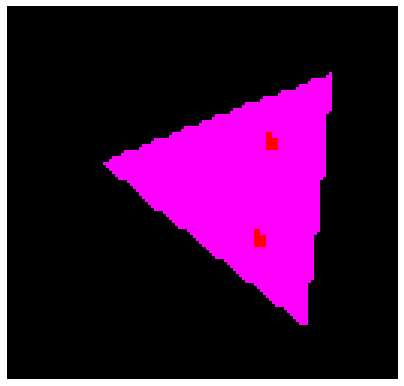

260 215 {'blue': 0, 'green': 0, 'yellow': 0, 'red': 0, 'white': 2}
Image shape:  (114, 140, 3)


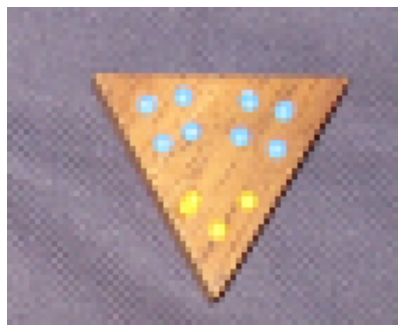

Image shape:  (114, 140, 3)


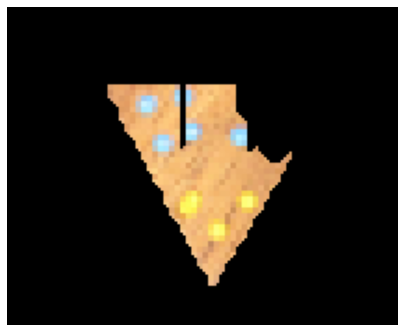

Image shape:  (114, 140, 3)


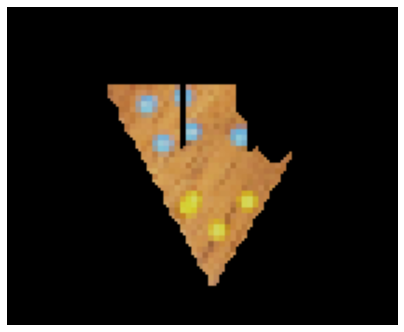

Image shape:  (114, 140, 3)


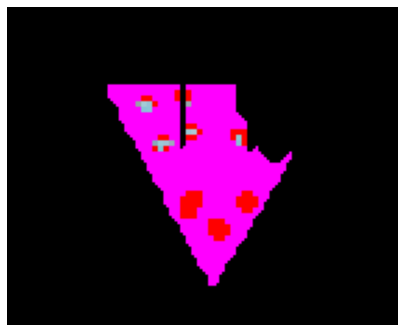

265 540 {'blue': 7, 'green': 0, 'yellow': 3, 'red': 0, 'white': 0}
Image shape:  (124, 130, 3)


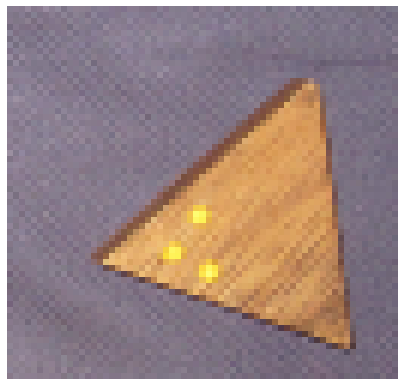

Image shape:  (124, 130, 3)


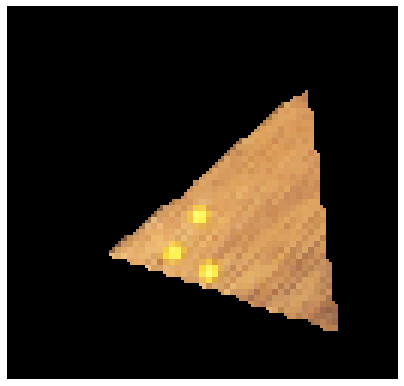

Image shape:  (124, 130, 3)


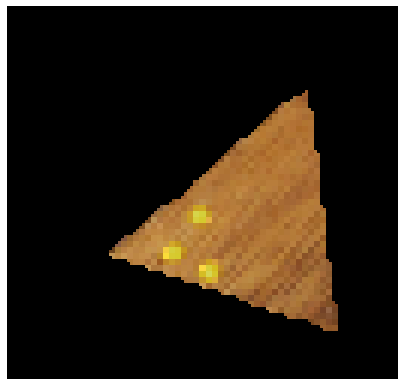

Image shape:  (124, 130, 3)


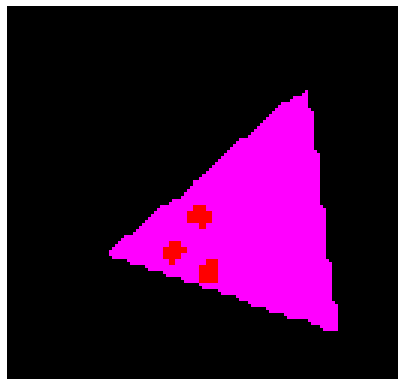

320 655 {'blue': 0, 'green': 0, 'yellow': 3, 'red': 0, 'white': 0}
Image shape:  (124, 130, 3)


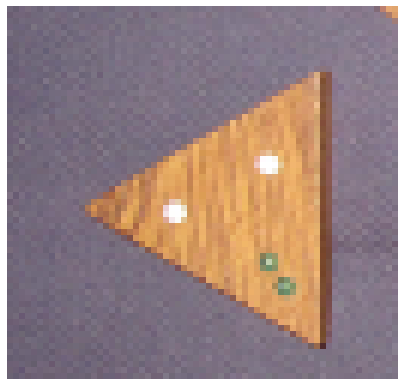

Image shape:  (124, 130, 3)


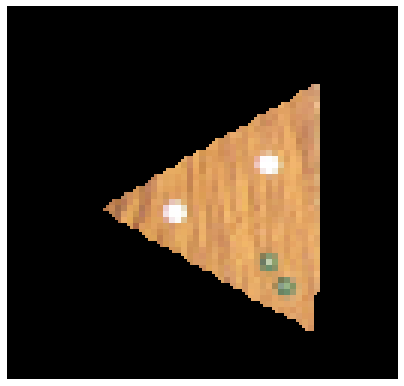

Image shape:  (124, 130, 3)


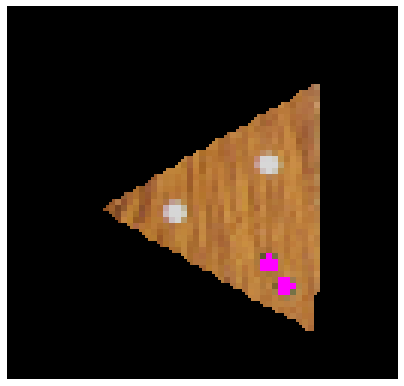

Image shape:  (124, 130, 3)


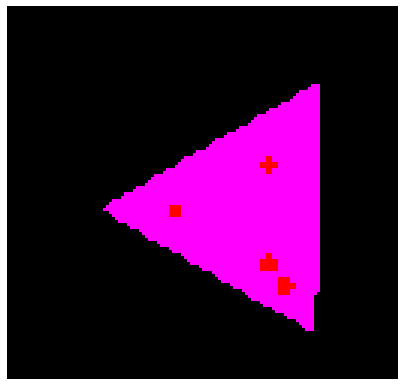

350 165 {'blue': 0, 'green': 2, 'yellow': 0, 'red': 0, 'white': 2}
Image shape:  (124, 140, 3)


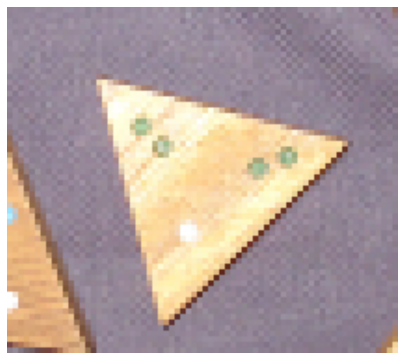

Image shape:  (124, 140, 3)


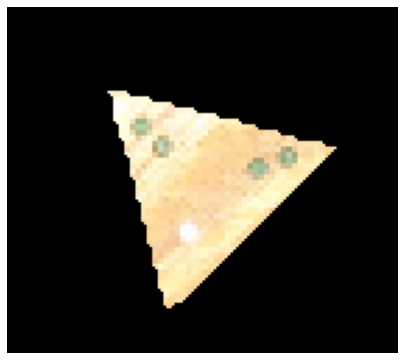

Image shape:  (124, 140, 3)


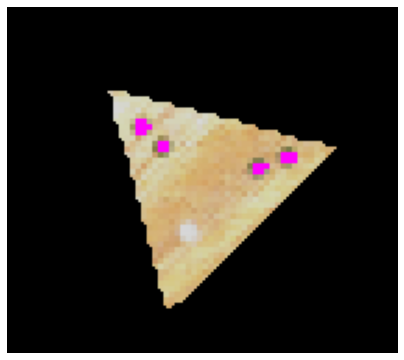

Image shape:  (124, 140, 3)


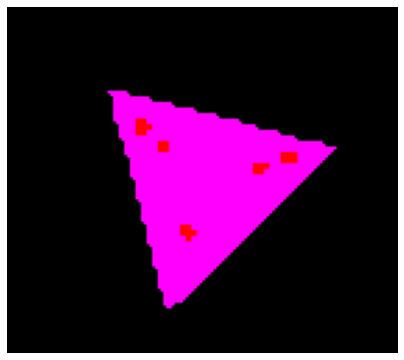

350 460 {'blue': 0, 'green': 4, 'yellow': 0, 'red': 0, 'white': 1}
Image shape:  (124, 140, 3)


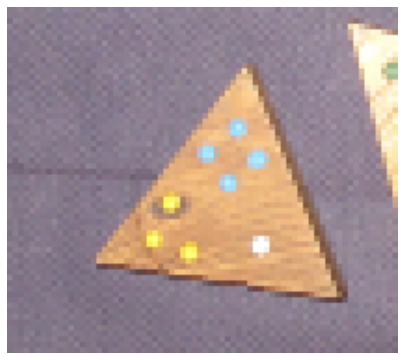

Image shape:  (124, 140, 3)


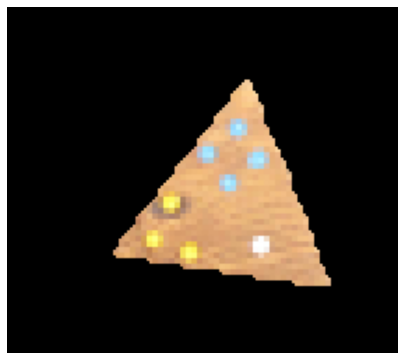

Image shape:  (124, 140, 3)


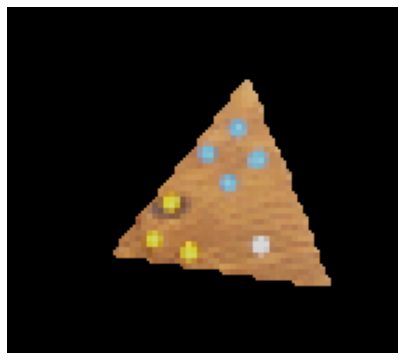

Image shape:  (124, 140, 3)


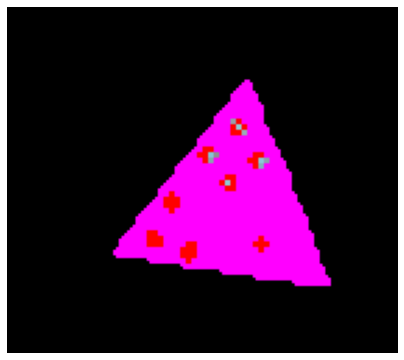

370 370 {'blue': 4, 'green': 0, 'yellow': 3, 'red': 0, 'white': 1}
Image shape:  (124, 140, 3)


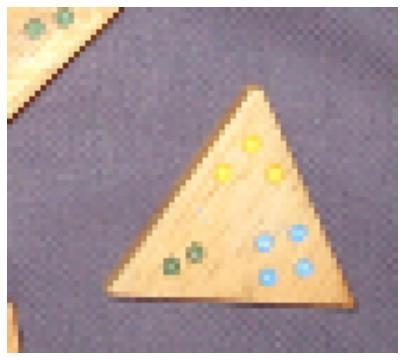

Image shape:  (124, 140, 3)


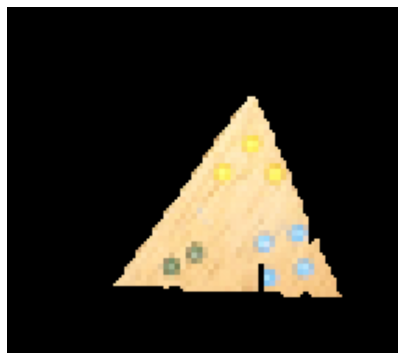

Image shape:  (124, 140, 3)


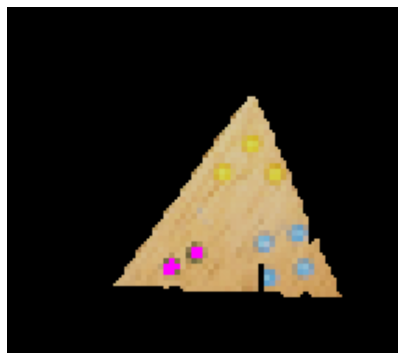

Image shape:  (124, 140, 3)


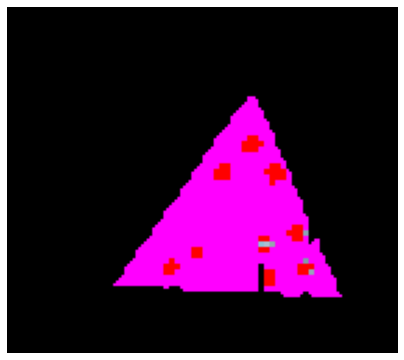

400 540 {'blue': 5, 'green': 2, 'yellow': 3, 'red': 0, 'white': 0}
Image shape:  (114, 130, 3)


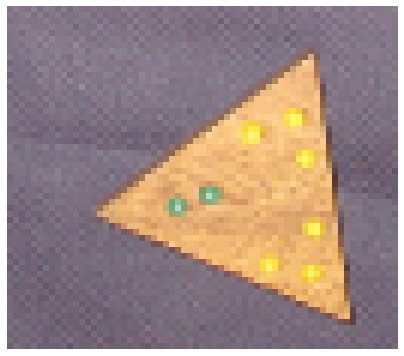

Image shape:  (114, 130, 3)


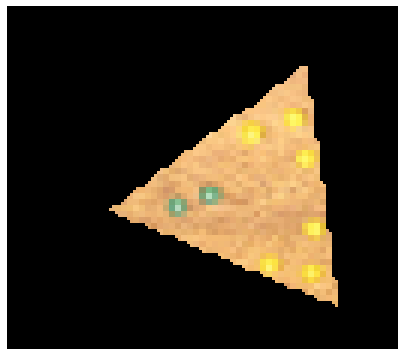

Image shape:  (114, 130, 3)


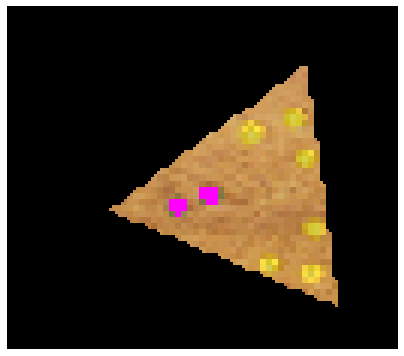

Image shape:  (114, 130, 3)


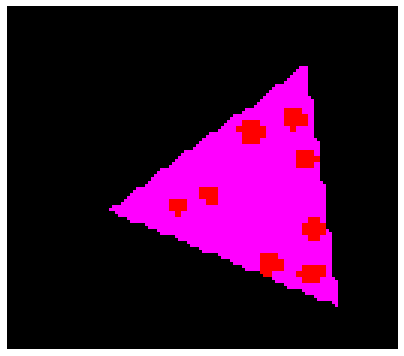

485 435 {'blue': 0, 'green': 2, 'yellow': 6, 'red': 0, 'white': 0}
Image shape:  (114, 130, 3)


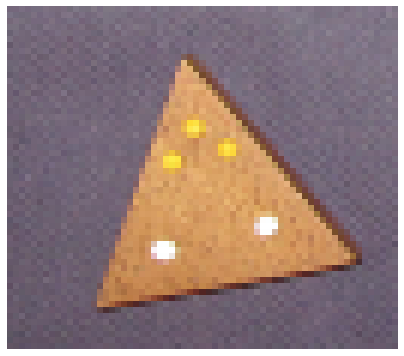

Image shape:  (114, 130, 3)


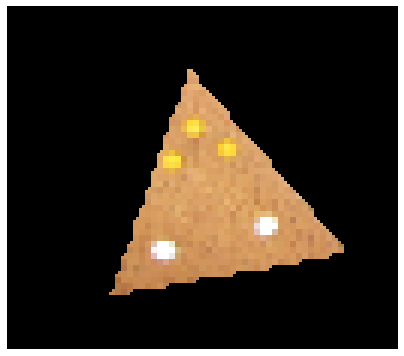

Image shape:  (114, 130, 3)


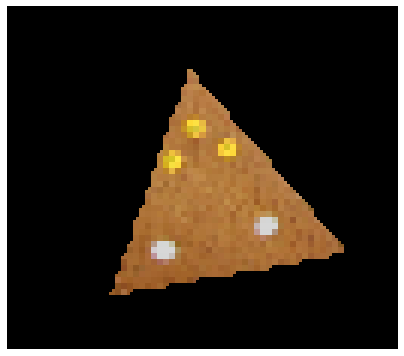

Image shape:  (114, 130, 3)


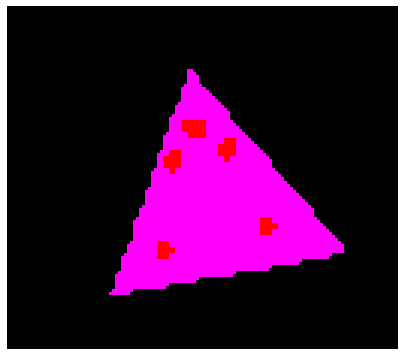

495 245 {'blue': 0, 'green': 0, 'yellow': 3, 'red': 0, 'white': 2}
Image shape:  (114, 140, 3)


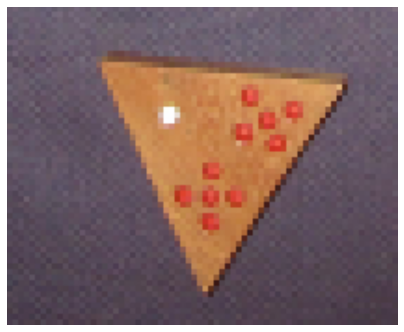

Image shape:  (114, 140, 3)


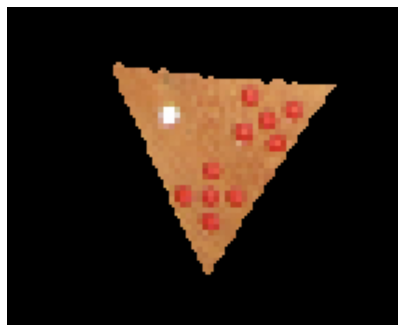

Image shape:  (114, 140, 3)


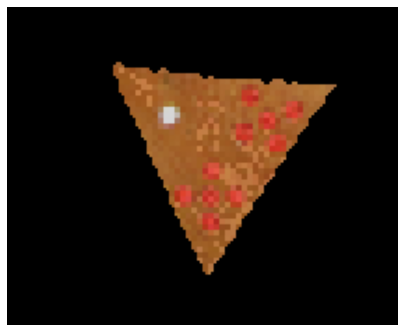

Image shape:  (114, 140, 3)


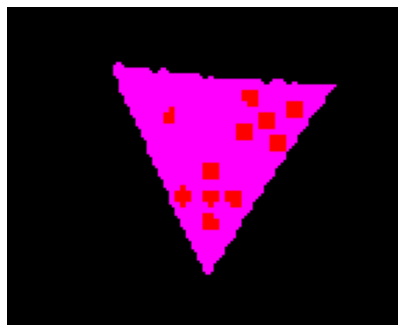

605 380 {'blue': 0, 'green': 0, 'yellow': 0, 'red': 10, 'white': 1}


In [103]:
frame_info = []
for frame in frames:
    imc = conv(cut(img, frame), 2) 
    imcc = mask(conv(imc, 5), M.contrast())
    imcc = tobw(tobw(imcc, 10), 0)
    imccw = incw(imcc, n=7, threshold=3)
    show(imc)
    #show(imccw)
    if np.mean(tonp(img)) > 80:
        #imcd = topil(tonp(unbright2(imc, 70, 40)) * make_perimeter(imccw))
        imcd = unbright2(imc, 70, 40)
        #show(imcd)
        #show(find_dots3(imcd, brightened=False))
        arr = find_dots3_to_arr(imcd, brightened=False)
    else:
        #imcd = topil(tonp(bright2(imc, 80)) * make_perimeter(imccw))
        imcd = bright2(imc, 80)
        #show(imcd)
        #show(find_dots3(imcd, brightened=True))
        arr = find_dots3_to_arr(imcd, brightened=True)
    
    #print(np.unique(arr))
    imc_arr = tonp(imc)
    imc_arr[arr == -1] = [255, 255, 255]
    #show(topil(imc_arr))
    imc_arr = tonp(imc)
    arr = group_dots(arr)
    imc_arr[arr == -1] = [255, 255, 255]
    #show(topil(imc_arr))
    
    #show(topil(make_perimeter_to_arr(arr)))
    #show(topil((tonp(imc).astype(int) * make_perimeter_to_arr(arr)[:, :, np.newaxis]).astype(np.uint8)))
    only_fishka = topil((tonp(imc).astype(int) * make_perimeter_to_arr(arr)[:, :, np.newaxis]).astype(np.uint8))
    show(only_fishka)
    if np.mean(tonp(img)) > 80:
        imcd = unbright2(only_fishka, 70, 40)
        #arr = find_dots3_to_arr(imcd, brightened=False)
        arr = delete_rouges(find_dots3_to_arr(imcd, brightened=False))
        imcd_arr = tonp(imcd)
        imcd_arr[arr == 2] = [255, 0, 255]
        show(topil(imcd_arr))
        show(find_dots3(imcd, brightened=False))
    else:
        print(1)
        imcd = bright2(only_fishka, 85) ### !!! 80
        #arr = find_dots3_to_arr(imcd, brightened=True)
        arr = delete_rouges(find_dots3_to_arr(imcd, brightened=True))
        imcd_arr = tonp(imcd)
        imcd_arr[arr == 2] = [255, 0, 255]
        show(topil(imcd_arr))
        show(find_dots3(imcd, brightened=True))
    
    frame_info += [(frame, unite_groups2(arr))]
    fr = frame_info[-1][0]
    
    print((fr[0] + fr[1]) // 2, (fr[2] + fr[3]) // 2, frame_info[-1][1])
    #print(np.unique(arr))

In [104]:
def show_results(frame_information, image):
    for fishka in frame_information:
        frames = fishka[0]
        dots = fishka[1]
        print('Координаты центра:', (frames[0] + frames[1]) // 2, (frames[2] + frames[3]) // 2)
        print('Очки             :', end=' ')
        dots2 = {}
        errors = {}
        dots2['red'] = 1 if 3 <= dots['red'] <= 7 else 2 if 8 <= dots['red'] <= 12 else 3 if 13 <= dots['red'] <= 17 else 0
        dots2['blue'] = 1 if 2 <= dots['blue'] <= 6 else 2 if 7 <= dots['blue'] <= 10 else 3 if 11 <= dots['blue'] <= 14 else 0
        dots2['yellow'] = 1 if 1 <= dots['yellow'] <= 4 else 2 if 5 <= dots['yellow'] <= 7 else 3 if 8 <= dots['yellow'] <= 10 else 0
        dots2['green'] = 1 if 1 <= dots['green'] <= 2 else 2 if 3 <= dots['green'] <= 4 else 3 if 5 <= dots['white'] <= 7 else 0
        dots2['white'] = 1 if dots['white'] == 1 else 2 if dots['white'] == 2 else 3 if dots['white'] == 3 else 0
        
        space = dots2['white'] + dots2['green'] + dots2['yellow'] + dots2['blue'] + dots2['red']
        
        while space > 3:
            for c in dots2:
                if c == 3:
                    dots2[c] -= 1
                    break
            for c in dots2:
                if c == 2:
                    dots2[c] -= 1
                    break
            for c in dots2:
                if c == 1:
                    dots2[c] -= 1
                    break
                    
        color_dict = {'blue': 4, 'green': 2, 'yellow': 3, 'red': 5, 'white': 1}
        #for c in dots2:
        #    dots2[c] *= color_dict[c]
        
        for c in dots2:
            for cc in range(dots2[c]):
                print(color_dict[c], end='; ')
        print('\n')
    
    arr = tonp(image)
    for fishka in frame_information:
        frames = fishka[0]
        i = (frames[0] + frames[1]) // 2
        j = (frames[2] + frames[3]) // 2
        arr[i - 5:i + 5, j - 5:j + 5] = [255, 0, 0]
    show(topil(arr))

Координаты центра: 85 425
Очки             : 5; 3; 2; 

Координаты центра: 155 660
Очки             : 1; 1; 1; 

Координаты центра: 200 375
Очки             : 3; 3; 

Координаты центра: 260 215
Очки             : 1; 1; 

Координаты центра: 265 540
Очки             : 4; 4; 3; 

Координаты центра: 320 655
Очки             : 3; 

Координаты центра: 350 165
Очки             : 2; 1; 1; 

Координаты центра: 350 460
Очки             : 2; 2; 1; 

Координаты центра: 370 370
Очки             : 4; 3; 1; 

Координаты центра: 400 540
Очки             : 4; 3; 2; 

Координаты центра: 485 435
Очки             : 3; 3; 2; 

Координаты центра: 495 245
Очки             : 3; 1; 1; 

Координаты центра: 605 380
Очки             : 5; 5; 1; 

Image shape:  (684, 912, 3)


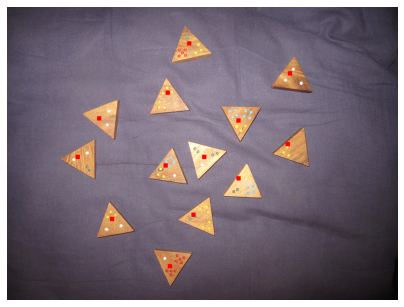

In [105]:
show_results(frame_info, img0)

Image shape:  (684, 912, 3)


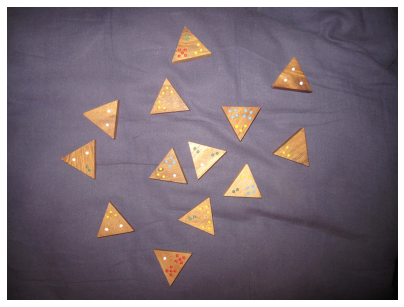

In [59]:
show(img0)

Image shape:  (134, 140, 3)


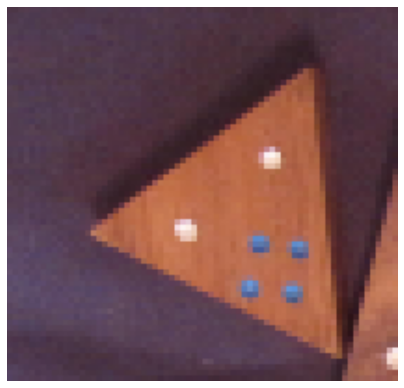

Image shape:  (134, 140, 3)


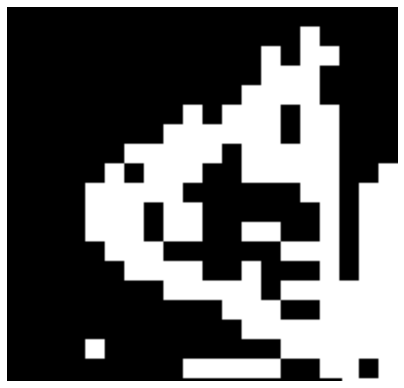

Image shape:  (134, 140, 3)


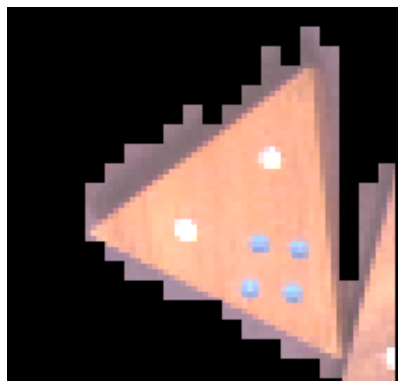

Image shape:  (134, 140, 3)


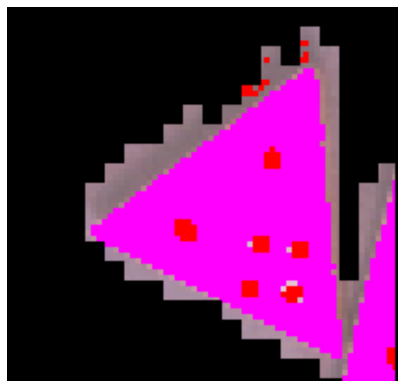

Image shape:  (124, 130, 3)


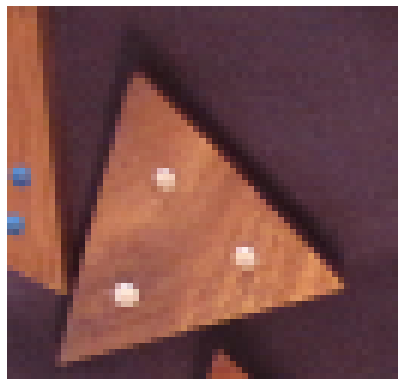

Image shape:  (124, 130, 3)


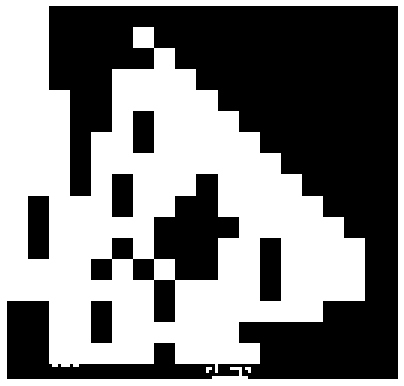

Image shape:  (124, 130, 3)


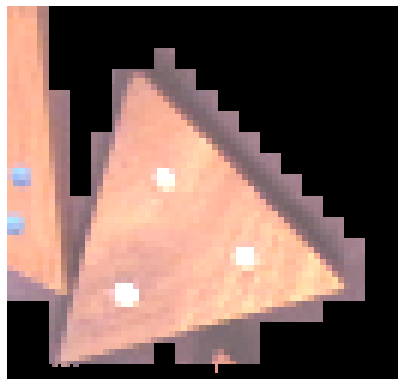

Image shape:  (124, 130, 3)


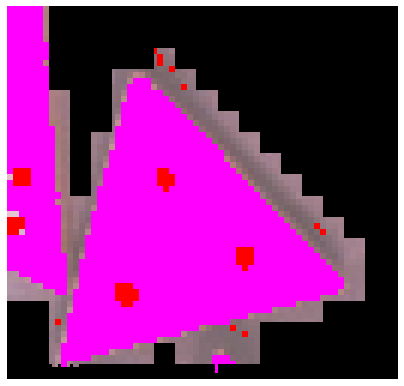

Image shape:  (124, 130, 3)


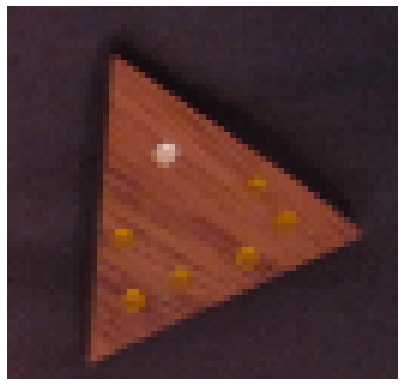

Image shape:  (124, 130, 3)


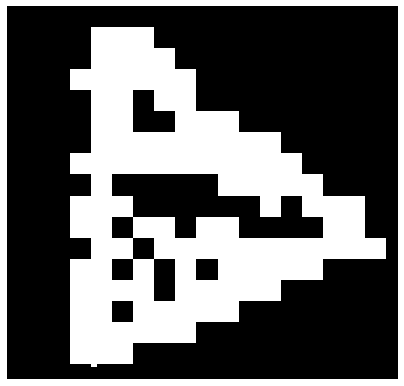

Image shape:  (124, 130, 3)


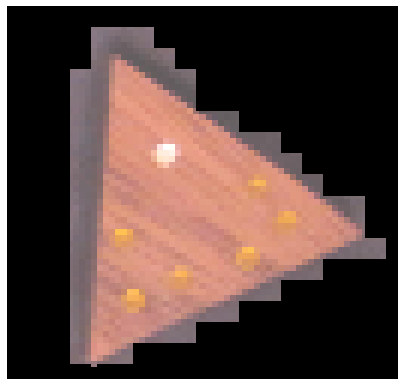

Image shape:  (124, 130, 3)


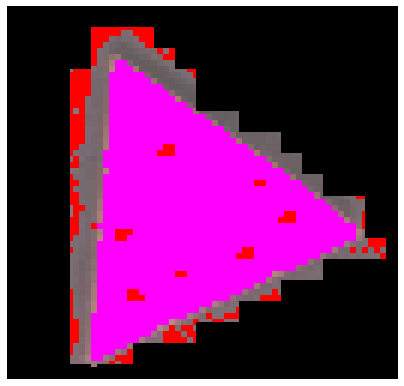

Image shape:  (124, 140, 3)


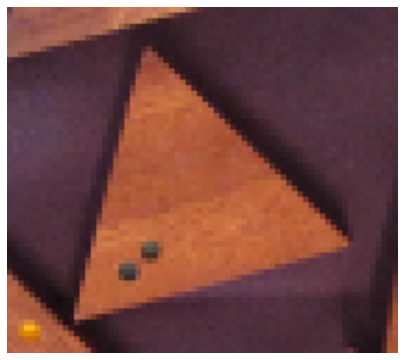

Image shape:  (124, 140, 3)


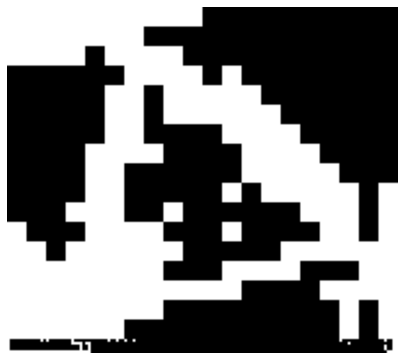

Image shape:  (124, 140, 3)


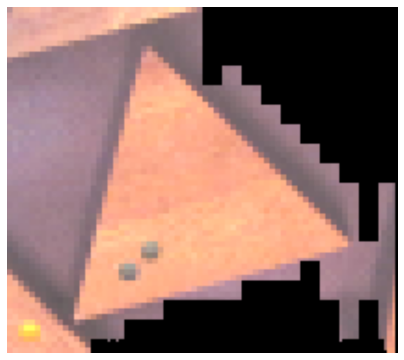

Image shape:  (124, 140, 3)


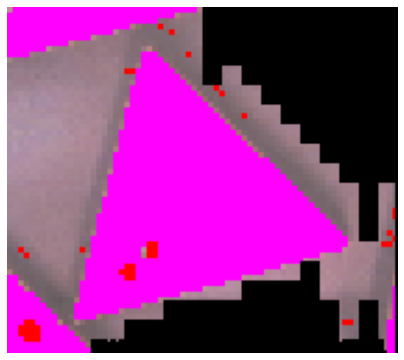

Image shape:  (124, 130, 3)


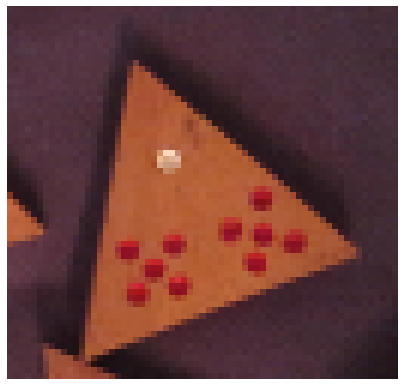

Image shape:  (124, 130, 3)


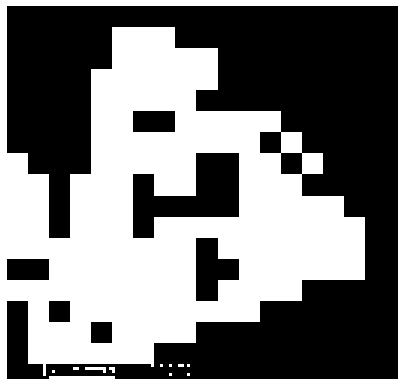

Image shape:  (124, 130, 3)


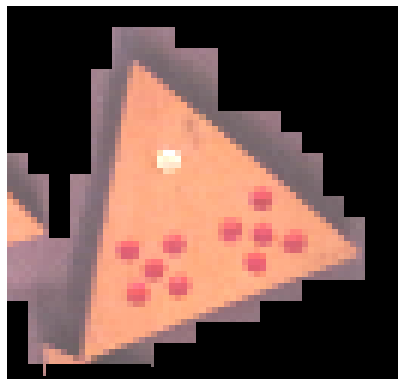

Image shape:  (124, 130, 3)


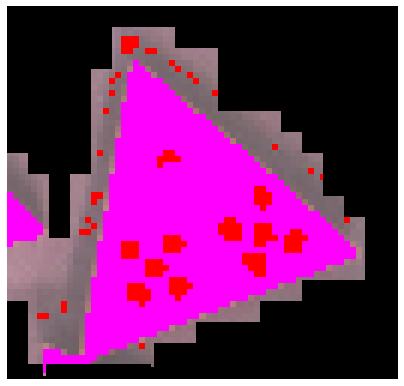

Image shape:  (124, 140, 3)


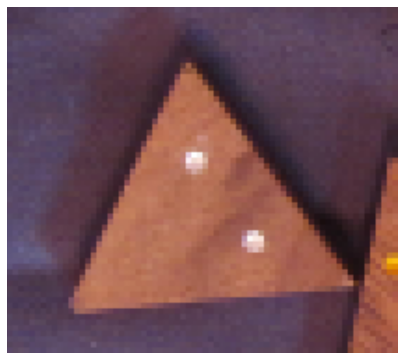

Image shape:  (124, 140, 3)


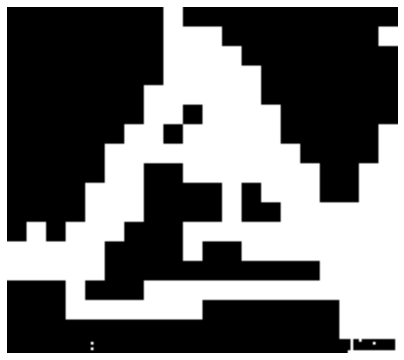

Image shape:  (124, 140, 3)


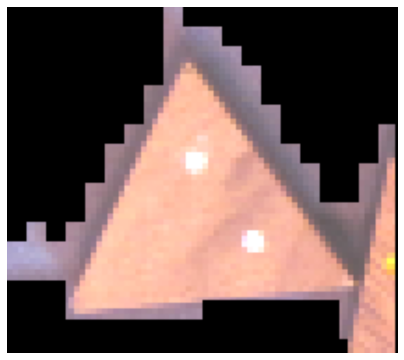

Image shape:  (124, 140, 3)


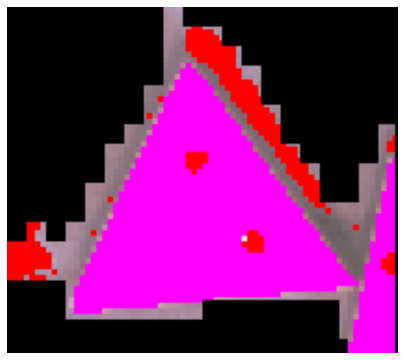

Image shape:  (124, 140, 3)


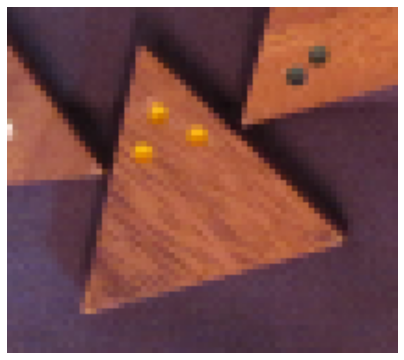

Image shape:  (124, 140, 3)


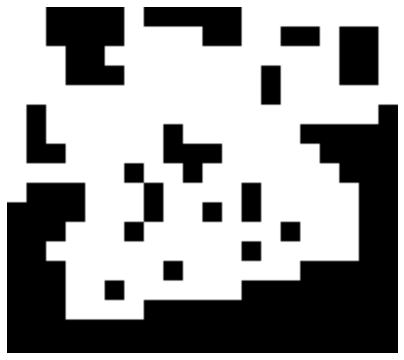

Image shape:  (124, 140, 3)


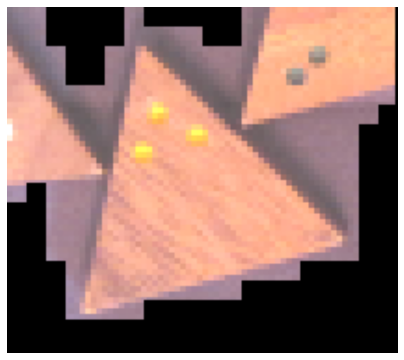

Image shape:  (124, 140, 3)


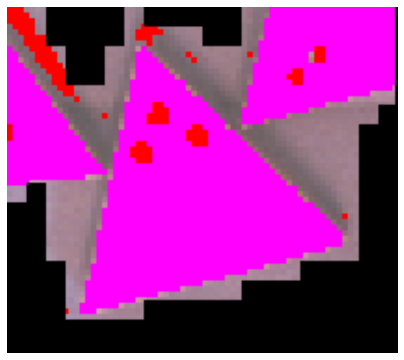

Image shape:  (114, 140, 3)


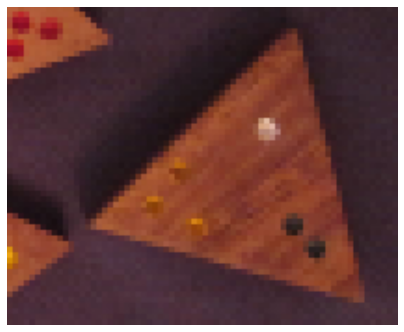

Image shape:  (114, 140, 3)


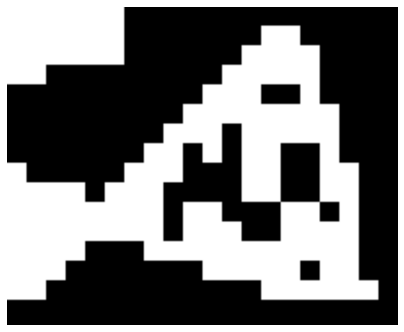

Image shape:  (114, 140, 3)


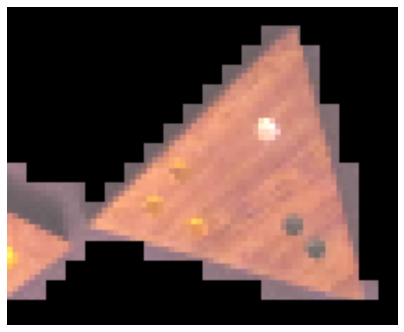

Image shape:  (114, 140, 3)


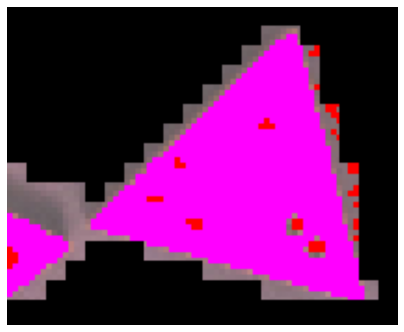

Image shape:  (134, 140, 3)


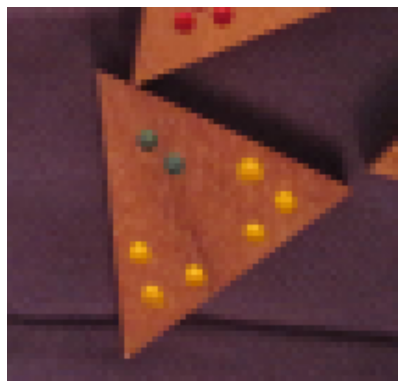

Image shape:  (134, 140, 3)


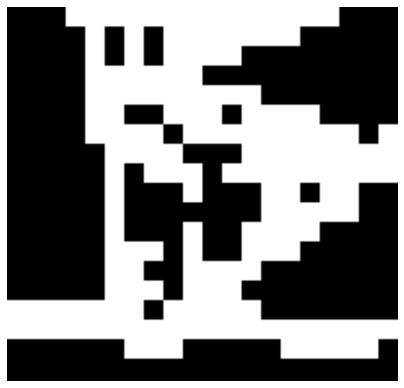

Image shape:  (134, 140, 3)


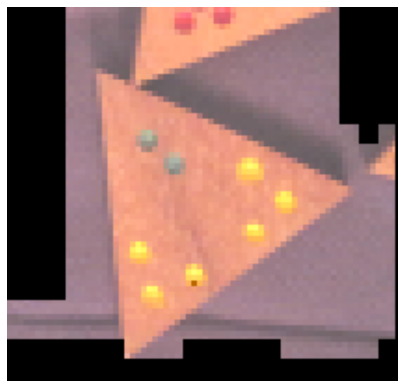

Image shape:  (134, 140, 3)


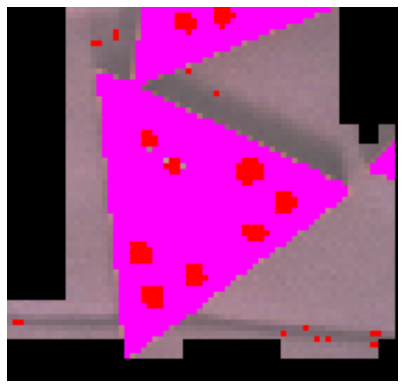

In [836]:
"""for frame in frames:
    imc = conv(cut(unbright2(img, 70, 40), frame), 2)
    #imc = conv(cut(unbright2(img), frame), 2)
    #imc = cut(bright2(img), frame)
    imcc = mask(conv(imc, 3), M.contrast())
    imcc = tobw(tobw(imcc, 10), 0)
    ###imccw = incw(imcc, n=7, threshold=6) ### good !!!
    imccw = incw(imcc, n=7, threshold=6)
    #imccw = incw(imcc, n=9, threshold=4)
    #imccw = incw(imcc, n=9, threshold=2)
    #imccw = incw(imcc, n=8, threshold=6)
    imcd = topil(tonp(imc) * make_perimeter(imccw))
    show(imcd)
    show(find_dots3(imcd))"""

for frame in frames:
    #imc = conv(cut(unbright2(img, 70, 50), frame), 2)
    imc = conv(cut(img, frame), 2) ### !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #imc = conv(cut(unbright2(img), frame), 2)
    #imc = cut(bright2(img), frame)
    imcc = mask(conv(imc, 3), M.contrast())
    #imcc = mask(conv(imc, 3), M.ver() + M.hor())
    imcc = tobw(tobw(imcc, 10), 0)
    ###imccw = incw(imcc, n=7, threshold=6) ### good !!!
    imccw = incw(imcc, n=7, threshold=3)
    #imccw = incw(imcc, n=9, threshold=4)
    #imccw = incw(imcc, n=9, threshold=2)
    #imccw = incw(imcc, n=8, threshold=6)
    show(imc)
    show(imccw)
    if np.mean(tonp(img)) > 80:
        imcd = topil(tonp(unbright2(imc, 70, 40)) * make_perimeter(imccw))
        show(imcd)
        show(find_dots3(imcd, brightened=False))
    else:
        imcd = topil(tonp(bright2(imc, 80)) * make_perimeter(imccw))
        show(imcd)
        show(find_dots3(imcd, brightened=True))
    #imcd = topil(tonp(bright2(imc, 55)) * make_perimeter(imccw))
    #show(imcd)
    #show(find_dots3(imcd))

Image shape:  (25, 30, 3)


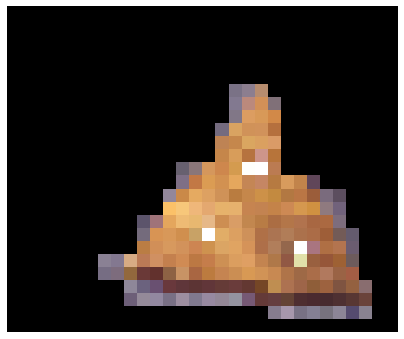

In [730]:
show(conv2(imcd, 5))

Image shape:  (128, 150, 3)


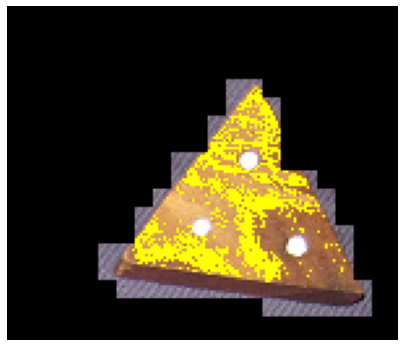

0
97


In [722]:
shape = tonp2(imcd)[0].shape
a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (210, 120, 80), 30)]
b = np.array([(elem // shape[1], elem % shape[1]) for elem in a])
imcd1 = copy.copy(imcd)

for elem in b:
    imcd1 = putpix(imcd1, elem[0], elem[1], (255, 255, 0))
show(imcd1)
print(len(np.where(gen_loccol(imcd, (195, 68, 48), 30))[0]))
print(len(np.where(gen_loccol(imcd, (255, 255, 255), 30))[0]))

Image shape:  (138, 180, 3)


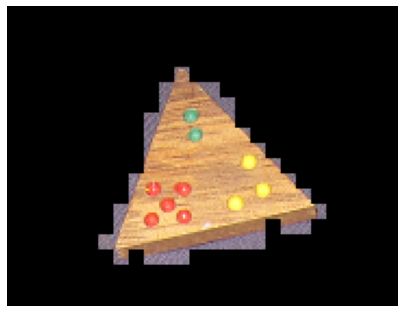

In [616]:
shape = tonp2(imcd)[0].shape
a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (205, 51, 44), 10)]
b = np.array([(elem // shape[1], elem % shape[1]) for elem in a])
imcd1 = copy.copy(imcd)

for elem in b:
    imcd1 = putpix(imcd1, elem[0], elem[1], (255, 255, 0))
show(imcd1)

In [287]:
il = 0
jl = 0
kl = 0
l = 0
for i in range(210, 251):
    for j in range(120, 121):
        for k in range(60, 81):
            locl = len(np.where(gen_loccol(imcd, (i, j, k), 30))[0])
            if locl > l:
                l = locl
                il = i
                jl = j
                kl = k
print(il, jl, kl, l)

210 120 80 218


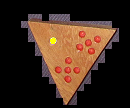

In [254]:
shape = tonp2(imcd)[0].shape
a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imcd, (255, 255, 255), 10)]
b = np.array([(elem // shape[1], elem % shape[1]) for elem in a])
imcd1 = copy.copy(imcd)

for elem in b:
    imcd1 = putpix(imcd1, elem[0], elem[1], (255, 255, 0))
imcd1

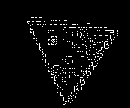

In [850]:
topil(tonp(imcc) * make_perimeter(imccw))

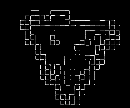

In [843]:
mask(conv(imcd, 5), M.contrast())

In [648]:
#desease(imcc, 3)

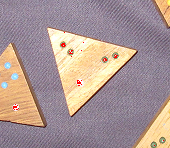

In [1010]:
shape = tonp2(imc)[0].shape
a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imc, (153, 255, 153), 70)]
b = np.array([(elem // shape[1], elem % shape[1]) for elem in a])
imc1 = copy.copy(imc)

for elem in b:
    imc1 = putpix(imc1, elem[0], elem[1], (255, 0, 0))
    
    
    
a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imc, (255, 255, 255), 0)]
b = np.array([(elem // shape[1], elem % shape[1]) for elem in a])

for elem in b:
    imc1 = putpix(imc1, elem[0], elem[1], (255, 0, 0))
    
imc1

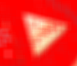

In [1014]:
shape = tonp2(imc)[0].shape
a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(imc, (209, 145,  96), 100)]
b = np.array([(elem // shape[1], elem % shape[1]) for elem in a])
imc1 = copy.copy(imc)

for elem in b:
    imc1 = putpix(imc1, elem[0], elem[1], (255, 0, 0))
conv(conv2(imc1, 2), 4)

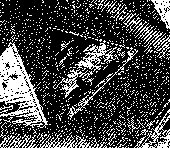

In [917]:
tobw(imc, 120)

In [892]:
imc0 = conv2(imc, 3)

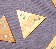

In [893]:
imc0

In [882]:
tonp(imc).shape

(108, 110, 3)

In [638]:
im0 = conv2(conv(conv(PD[2], 10), 10), 30)

In [660]:
shape = tonp2(im0)[0].shape
a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(im0, (209, 145,  96), 50)]
b = np.array([(elem // shape[1], elem % shape[1]) for elem in a])
im1 = copy.copy(im0)
for elem in b:
    im1 = putpix(im1, elem[0], elem[1], (255, 0, 0))
im1

In [667]:
im00 = conv2(PD[5], 30)

In [669]:
shape = tonp2(im00)[0].shape
a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(im00, (209, 145,  96), 0)]
b = np.array([(elem // shape[1], elem % shape[1]) for elem in a])
im1 = copy.copy(im00)
for elem in b:
    im1 = putpix(im1, elem[0], elem[1], (255, 0, 0))
im1

In [547]:
conv2(PD[2], 30)

In [548]:
putpix(conv2(PD[2], 30), 0, 0, (255, 0, 0))

In [560]:
im = conv2(PD[2], 30)
shape = tonp2(im)[0].shape
a = np.arange(shape[0] * shape[1]).reshape(shape)[gen_loccol(im, (209, 145,  96), 70)]
b = np.array([(elem // shape[1], elem % shape[1]) for elem in a])
for elem in b:
    im = putpix(im, elem[0], elem[1], (255, 0, 0))
im

In [505]:
getpix(conv2(PD[2], 30), 0, 0)

array([44, 39, 46], dtype=uint8)

In [447]:
getpix(conv2(PD[2], 30), 3, 14)

array([209, 145,  96], dtype=uint8)

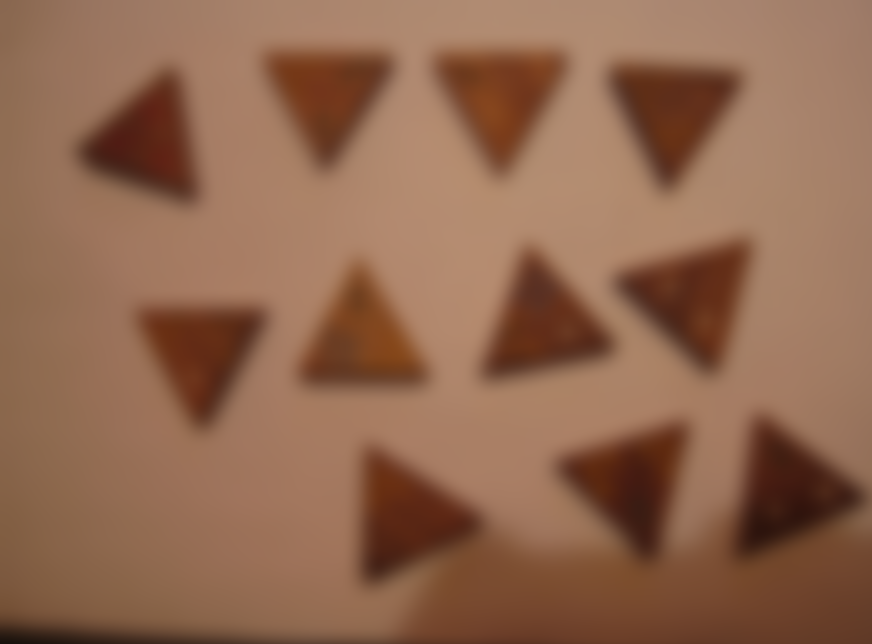

In [227]:
conv(conv(PD[0], 10), 10)

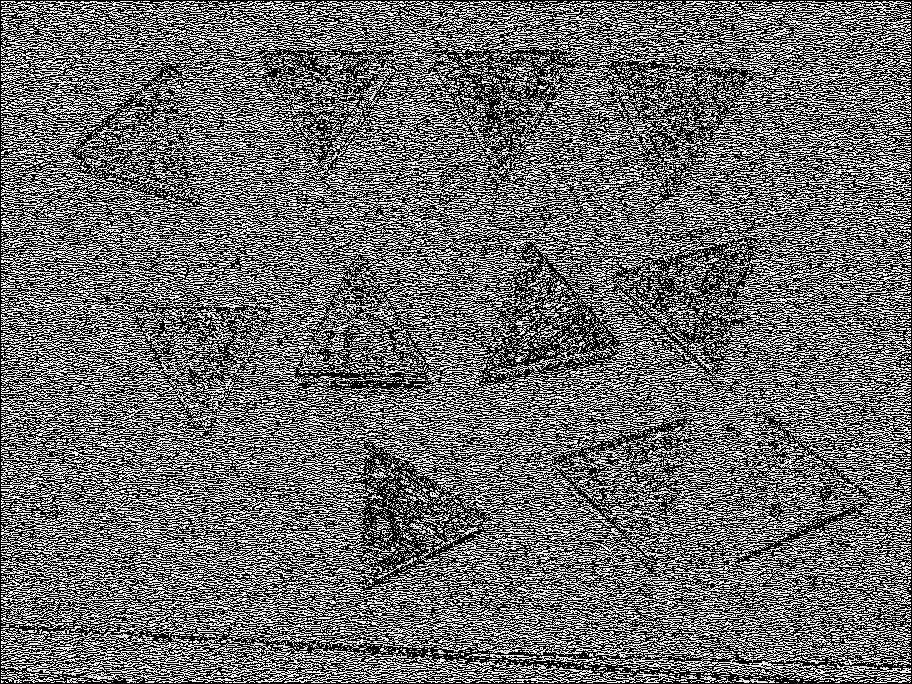

In [102]:
mask(PD[0], M.hor())

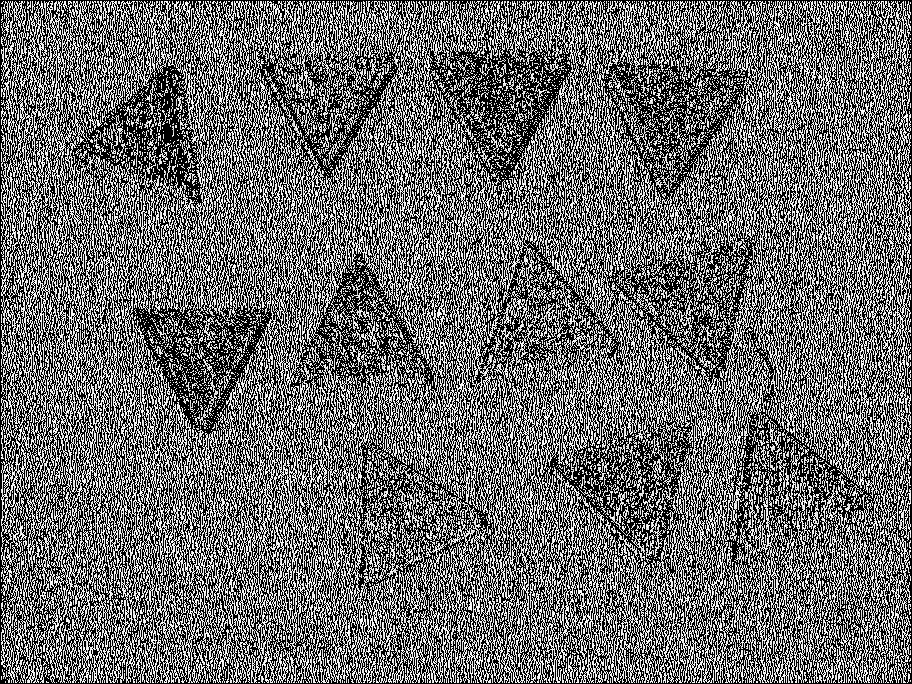

In [106]:
mask(PD[0], M.ver())

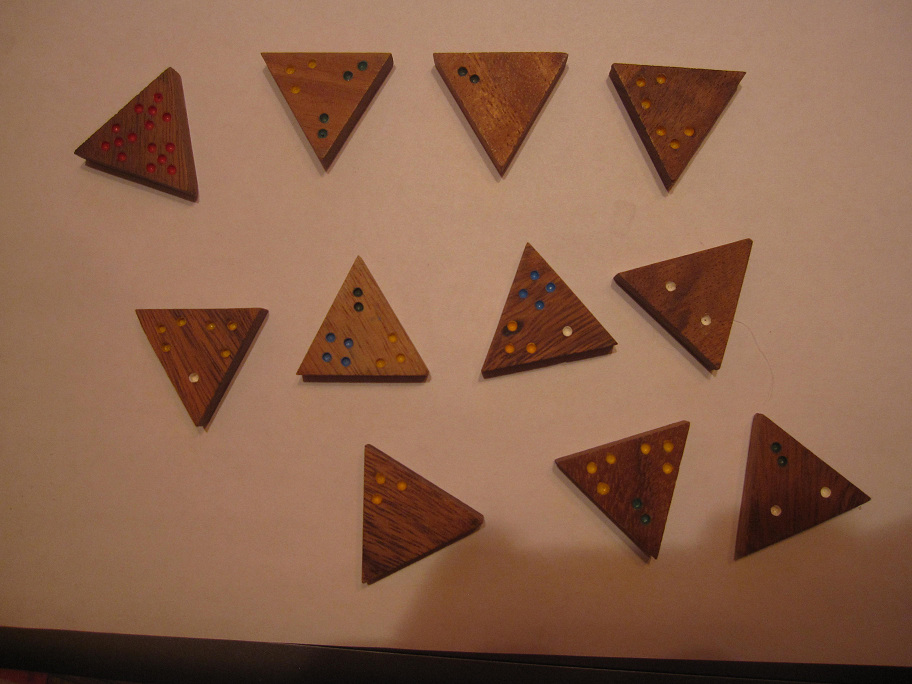

In [120]:
PD[0]

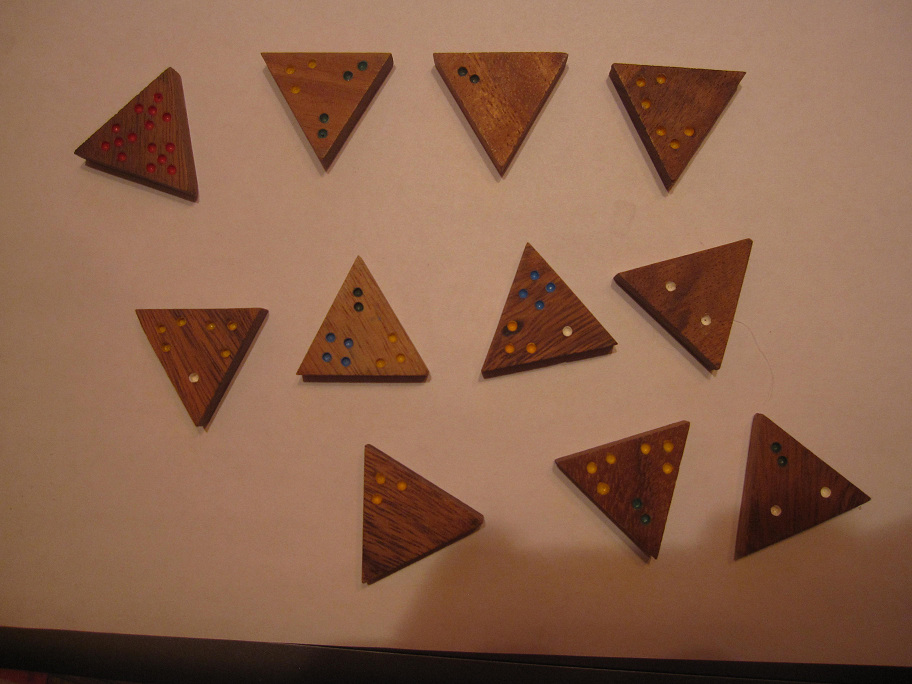

In [121]:
topil(tonp(PD[0]))

In [17]:
type(PD[0])

PIL.Image.Image

# Archive

In [ ]:
#lmap = gen_loccol(im0, (209, 145,  96), 110)
lmap = gen_loccol(im0, (209, 110,  80), 110)
#lmap = gen_loccol(im0, (209, 110,  90), 110)
grmap = np.zeros_like(lmap.astype(np.int))
grmap[lmap] = -1
grmap = make_share(grmap)
#print(grmap)
im3, frames = seg_to_image(img0, grmap)
img = img0

"""
imc = cut(img, frames[7])
#tobw(conv(imc, 10), 10)
#imc
#conv(imc, 10)
#print(tonp(conv(imc, 3)).shape)
##imcc = mask(conv(imc, 3), M.contrast())
imcc = mask(conv(imc, 3), M.contrast())
imcc = tobw(tobw(imcc, 150), 0)
show(imcc)
#show(im3)

imccw = incw(imcc, n=7, threshold=5)
#imccw = incw(imcc, n=10, threshold=5)
#show(imccw)

imcd = topil(tonp(imc) * make_perimeter(imccw))
show(imcd)
""";


for frame in frames:
    imc = cut(img, frame)
    #tobw(conv(imc, 10), 10)
    #imc
    #conv(imc, 10)
    #print(tonp(conv(imc, 3)).shape)
    ##imcc = mask(conv(imc, 3), M.contrast())
    
    ##imcc = mask(conv(imc, 3), M.contrast())
    imcc = mask(conv(imc, 3), M.contrast())
    imcc = tobw(tobw(imcc, 10), 0)
    #imcc = tobw(tobw(imcc, 50), 0)
    show(imcc)
    #show(im3)

    #imccw = incw(imcc, n=7, threshold=5)
    #imccw = incw(imcc, n=10, threshold=5)
    imccw = incw(imcc, n=7, threshold=5)
    #show(imccw)

    imcd = topil(tonp(imc) * make_perimeter(imccw))
    show(imcd)
;

In [ ]:
"""for frame in frames:
    imc = conv(cut(unbright2(img, 70, 40), frame), 2)
    #imc = conv(cut(unbright2(img), frame), 2)
    #imc = cut(bright2(img), frame)
    imcc = mask(conv(imc, 3), M.contrast())
    imcc = tobw(tobw(imcc, 10), 0)
    ###imccw = incw(imcc, n=7, threshold=6) ### good !!!
    imccw = incw(imcc, n=7, threshold=6)
    #imccw = incw(imcc, n=9, threshold=4)
    #imccw = incw(imcc, n=9, threshold=2)
    #imccw = incw(imcc, n=8, threshold=6)
    imcd = topil(tonp(imc) * make_perimeter(imccw))
    show(imcd)
    show(find_dots3(imcd))"""

for frame in frames:
    #imc = conv(cut(unbright2(img, 70, 50), frame), 2)
    imc = conv(cut(img, frame), 2) ### !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    #imc = conv(cut(unbright2(img), frame), 2)
    #imc = cut(bright2(img), frame)
    imcc = mask(conv(imc, 3), M.contrast())
    #imcc = mask(conv(imc, 3), M.ver() + M.hor())
    imcc = tobw(tobw(imcc, 10), 0)
    ###imccw = incw(imcc, n=7, threshold=6) ### good !!!
    imccw = incw(imcc, n=7, threshold=3)
    #imccw = incw(imcc, n=9, threshold=4)
    #imccw = incw(imcc, n=9, threshold=2)
    #imccw = incw(imcc, n=8, threshold=6)
    show(imc)
    show(imccw)
    if np.mean(tonp(img)) > 80:
        imcd = topil(tonp(unbright2(imc, 70, 40)) * make_perimeter(imccw))
        show(imcd)
        show(find_dots3(imcd, brightened=False))
    else:
        imcd = topil(tonp(bright2(imc, 80)) * make_perimeter(imccw))
        show(imcd)
        show(find_dots3(imcd, brightened=True))
    #imcd = topil(tonp(bright2(imc, 55)) * make_perimeter(imccw))
    #show(imcd)
    #show(find_dots3(imcd))

In [ ]:
for frame in frames:
    imc = conv(cut(img, frame), 2) 
    imcc = mask(conv(imc, 5), M.contrast())
    imcc = tobw(tobw(imcc, 10), 0)
    imccw = incw(imcc, n=7, threshold=3)
    show(imc)
    #show(imccw)
    if np.mean(tonp(img)) > 80:
        #imcd = topil(tonp(unbright2(imc, 70, 40)) * make_perimeter(imccw))
        imcd = unbright2(imc, 70, 40)
        #show(imcd)
        #show(find_dots3(imcd, brightened=False))
        arr = find_dots3_to_arr(imcd, brightened=False)
    else:
        #imcd = topil(tonp(bright2(imc, 80)) * make_perimeter(imccw))
        imcd = bright2(imc, 80)
        #show(imcd)
        #show(find_dots3(imcd, brightened=True))
        arr = find_dots3_to_arr(imcd, brightened=True)
    
    #print(np.unique(arr))
    imc_arr = tonp(imc)
    imc_arr[arr == -1] = [255, 255, 255]
    #show(topil(imc_arr))
    imc_arr = tonp(imc)
    arr = group_dots(arr)
    imc_arr[arr == -1] = [255, 255, 255]
    #show(topil(imc_arr))
    
    #show(topil(make_perimeter_to_arr(arr)))
    #show(topil((tonp(imc).astype(int) * make_perimeter_to_arr(arr)[:, :, np.newaxis]).astype(np.uint8)))
    only_fishka = topil((tonp(imc).astype(int) * make_perimeter_to_arr(arr)[:, :, np.newaxis]).astype(np.uint8))
    show(only_fishka)
    if np.mean(tonp(img)) > 80:
        imcd = unbright2(only_fishka, 70, 40)
        arr = find_dots3_to_arr(imcd, brightened=False)
        imcd_arr = tonp(imcd)
        imcd_arr[arr == 1] = [255, 0, 255]
        show(topil(imcd_arr))
        #show(find_dots3(imcd, brightened=False))
    else:
        print(1)
        imcd = bright2(only_fishka, 80)
        arr = find_dots3_to_arr(imcd, brightened=True)
        imcd_arr = tonp(imcd)
        imcd_arr[arr == 1] = [255, 0, 255]
        show(topil(imcd_arr))
        #show(find_dots3(imcd, brightened=True))
      
    print(np.unique(arr))